# Lab 3: Rigid Registration


## Remainder

Among other useful information, it tells you to make a copy of this Colab notebook BEFORE you try to run it:

- Make a copy on your own Colab space by clicking on the `copy to drive` button.
- Alternatively you could go to the menu `File > Save a copy in Drive`
- Then, open your new file on a new tap and rename it, and you’re ready to start tinkering with the code
- Look carefully at the existing code before you execute it. Try to understand what the code is doing. Part of your learning outcome is to understand it, and we will quiz you about it.
- In several places of the code, you’ll find `#__________TO DO_________`.
There you should introduce your code.

Once you are done, submit this notebook by the lab deadline, with the cells executed and including your **answers** in the text fields in $\color{red}{\text{red}}$ color.

Use `$\color{red}{\text{This is my red text}}$` to write "$\color{red}{\text{This is my red text}}$".

# Loading the required files
You can load into the temporal workspace of Colab the following required files:

*   the data files `LAB3_data`. Download them from Moodle to your computer and uncompress them.

You should copy these files from your computer using the function `files.upload()`. Use the `Choose Files` button to upload both files from your local drive.

Don't use Safari, it is preferable to use google chrome

## Goals of this lab
The aim of this lab is to develop competences regarding teamwork and problem solving. By developing the proposed activity you will also become familiar with SIFT and planar transformations for rigid image registration: how to extract invariant features, how to describe them, how to match them and how to use them to compute a homography. Most importantly, this should give you some feeling about the strengths and weaknesses of local feature-based approaches.
It should be noted that before you start this activity, you should read Lowe’s paper on SIFT:

David G. Lowe, "Distinctive image features from scale-invariant keypoints," International Journal of Computer Vision, 60, 2 (2004), pp. 91-110.
The paper can be downloaded from [here](http://www.cs.ubc.ca/~lowe/papers/ijcv04.pdf).

This lab requires working in teams of two (exceptionally three) students. The labs will be organized on the first lab session by the professor who acts as lab instructor.

Students will have to:

1. Test Lowe’s implementation on a set of images showing some skin lesions.
2. Register the images pairs corresponding to the same skin lesion using Lowe’s implementation to detect and match features, and implementing different motion models by estimating homography matrices.
3. Improve the registration accuracy by means of data normalization for the homography estimation.

In [ ]:
#Option 1 upload files manually
#from google.colab import files
#uploaded = files.upload()

#Option 3 upload files from folder in drive
from google.colab import drive
# Mount Google Drive
drive.mount('/content/drive')
# Specify the folder path in Google Drive containing the images
drive_folder_path = '/content/drive/MyDrive/MIRAMISA/Lab3MIRA'  # Replace with your folder path
local_folder_path = '/content/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Additional tools
In this lab, we will also make use of:
- NumPy, a popular library for scientific computing
- Matplotlib, a popular library for plotting data
- Routines in the aux_utils.py file, which should already be in the local directory
- Opencv
-...

In [ ]:
import math, copy
import numpy as np
from numpy import genfromtxt
import matplotlib.pyplot as plt
plt.style.use('Solarize_Light2')
#from aux_utils import plt_house_x, plt_contour_wgrad, plt_gradients, plt_cost_vs_theta1
from google.colab import files
# import time
from IPython import display
from time import sleep
# import opencv
import cv2
from google.colab.patches import cv2_imshow

import pandas as pd
import io

#Import math Library
import math
import scipy.linalg as linalg

In [ ]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn-v0_8',
 'seaborn-v0_8-bright',
 'seaborn-v0_8-colorblind',
 'seaborn-v0_8-dark',
 'seaborn-v0_8-dark-palette',
 'seaborn-v0_8-darkgrid',
 'seaborn-v0_8-deep',
 'seaborn-v0_8-muted',
 'seaborn-v0_8-notebook',
 'seaborn-v0_8-paper',
 'seaborn-v0_8-pastel',
 'seaborn-v0_8-poster',
 'seaborn-v0_8-talk',
 'seaborn-v0_8-ticks',
 'seaborn-v0_8-white',
 'seaborn-v0_8-whitegrid',
 'tableau-colorblind10']

## Detect SIFT Keypoints and Descriptors
Now we will register real images.

Register skin1.png with skin2.png

First, load and show the images.

Also set SIFT to detect keypoints on images

$\color{yellow}{\text{To be done during 1st lab session}}$

In [ ]:
skin_1 = cv2.imread('/content/drive/MyDrive/MIRAMISA/Lab3MIRA/skin1.png')
skin_2 = cv2.imread('/content/drive/MyDrive/MIRAMISA/Lab3MIRA/skin2.png')

# Show Images
plt.figure(1)
plt.imshow(cv2.cvtColor(skin_1, cv2.CV_32S))
plt.title('Train Image')

plt.figure(2)
plt.imshow(cv2.cvtColor(skin_2, cv2.CV_32S))
plt.title('Query Image')

## Plot the Keypoints
$\color{yellow}{\text{To be done during 1st lab session}}$

Code based on: https://github.com/OpenGenus/SIFT-Scale-Invariant-Feature-Transform/blob/master/src/sift-keypoint.py

In [ ]:

train_img = skin_1

query_img = skin_2

# Show Images
plt.figure(1)
plt.imshow(cv2.cvtColor(train_img, cv2.CV_32S))
plt.title('Train Image')

plt.figure(2)
plt.imshow(cv2.cvtColor(query_img, cv2.CV_32S))
plt.title('Query Image')



# Turn Images to grayscale

def to_gray(color_img):
    gray = cv2.cvtColor(color_img, cv2.COLOR_BGR2GRAY)
    return gray

train_img_gray = cv2.cvtColor(train_img, cv2.COLOR_BGR2GRAY)
query_img_gray = cv2.cvtColor(query_img, cv2.COLOR_BGR2GRAY)

plt.figure(3)
plt.imshow(train_img_gray, cmap='gray')
plt.title('Train Image -Gray')


plt.figure(4)
plt.imshow(query_img_gray, cmap= 'gray')
plt.title('Query Image -Gray')


# Initialise SIFT detector
sift = cv2.SIFT_create()

# Generate SIFT keypoints and descriptors
train_kp, train_desc = sift.detectAndCompute(train_img_gray, None)
query_kp, query_desc = sift.detectAndCompute(query_img_gray, None)

train_img_with_kp = cv2.drawKeypoints(train_img, train_kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
query_img_with_kp = cv2.drawKeypoints(query_img, query_kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(5)
plt.imshow(cv2.cvtColor(train_img_with_kp, cv2.COLOR_BGR2RGB))
plt.title('Train Image Keypoints')

plt.figure(6)
plt.imshow(cv2.cvtColor(query_img_with_kp, cv2.COLOR_BGR2RGB))
plt.title('Query Image Keypoints')

## Compute Brute Force Matching

$\color{yellow}{\text{To be done during 1st lab session}}$

In [ ]:
# create a BFMatcher object which will match up the SIFT features
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

matches = bf.match(train_desc, query_desc)

# Sort the matches in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# draw the top N matches
N_MATCHES = 100

match_img = cv2.drawMatches(
    train_img, train_kp,
    query_img, query_kp,
    matches[:N_MATCHES], query_img.copy(), flags=0)


Plot matches

$\color{yellow}{\text{To be done during 1st lab session}}$

In [ ]:
plt.figure(7)
plt.imshow(cv2.cvtColor(match_img, cv2.CV_32S))
plt.title('SIFT Detection')
plt.show()

## Lowe match

Now implement by yourself a function to match keypoints and descriptors between these 2 images

Implement the function `SIFT_match` following the article "Distinctive image features from scale-invariant keypoints" David G. Lowe.

$\color{yellow}{\text{To be done during 1st lab session}}$

In [ ]:
def SIFT_match(descriptors1, descriptors2, ratio=0.7):
    """
    Matches descriptors using Lowe's ratio test.

    Parameters:
    - descriptors1: Descriptors from image 1
    - descriptors2: Descriptors from image 2
    - ratio: Ratio threshold for filtering matches (default is 0.7 as per Lowe's paper)

    Returns:
    - good_matches: List of filtered matches that pass Lowe's ratio test
    """
    bf = cv2.BFMatcher(cv2.NORM_L2)  # Using L2 norm for SIFT
    initial_matches = bf.knnMatch(descriptors1, descriptors2, k=2)  # Find two nearest neighbors

    # Apply Lowe's ratio test
    good_matches = []
    for m, n in initial_matches:
        if m.distance < ratio * n.distance: #This forces the match to be unambiguous and not due to change
            good_matches.append(m)

    return good_matches


Recompute the matches using your function

$\color{yellow}{\text{To be done during 1st lab session}}$

In [ ]:
# Load the two images
image1 = cv2.imread('/content/drive/MyDrive/MIRAMISA/Lab3MIRA/skin1.png')
image2 = cv2.imread('/content/drive/MyDrive/MIRAMISA/Lab3MIRA/skin2.png')

image1_gray = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
image2_gray = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Detect keypoints and compute descriptors
keypoints1, descriptors1 = sift.detectAndCompute(image1_gray, None)
keypoints2, descriptors2 = sift.detectAndCompute(image2_gray, None)

# Match descriptors using SIFT_match function
good_matches = SIFT_match(descriptors1, descriptors2, ratio=0.75)

# Draw the matches on the images
matched_image = cv2.drawMatches(image1, keypoints1, image2, keypoints2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

Plot the new matches

$\color{yellow}{\text{To be done during 1st lab session}}$

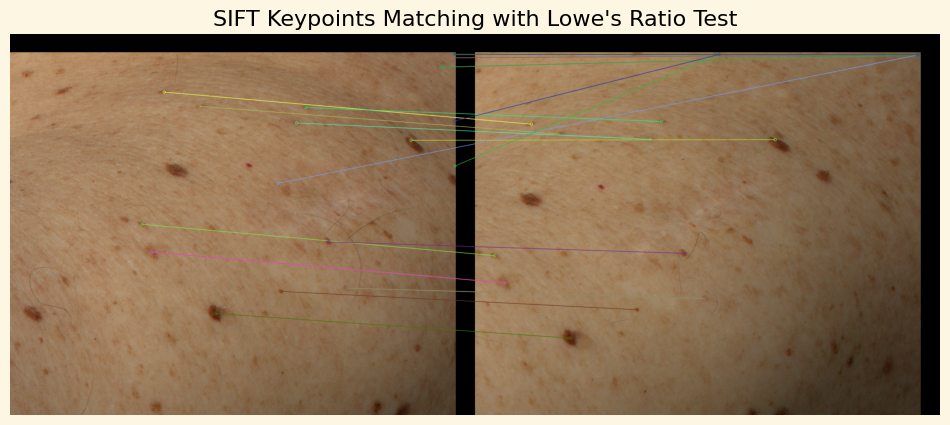

Number of keypoints in Image 1: 78
Good matches after Lowe's ratio test: 25


In [ ]:
# Display the matched keypoints
plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(matched_image, cv2.COLOR_BGR2RGB))
plt.title("SIFT Keypoints Matching with Lowe's Ratio Test")
plt.axis('off')
plt.show()

# Optional: Print summary of matches
print(f"Number of keypoints in Image 1: {len(keypoints1)}")
# print(f"Number of keypoints in Image 2: {len(keypoints2)}")
print(f"Good matches after Lowe's ratio test: {len(good_matches)}")

## Compute Homographies

Compute the homography between both images using opencv function `cv2.findHomography`

Plot one of the images warped acording to the obtained Homograhy

$\color{yellow}{\text{To be done during 1st lab session}}$

In [ ]:
points1 = np.float32([keypoints1[m.queryIdx].pt for m in good_matches])
points2 = np.float32([keypoints2[m.trainIdx].pt for m in good_matches])

H, mask = cv2.findHomography(points1, points2, cv2.RANSAC, 5.0)

# Warp img1 to align with img2 using the homography matrix
height, width = image2_gray.shape
warped_img1 = cv2.warpPerspective(image1, H, (width, height))

plt.figure(figsize=(15, 10))

# Show original images
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
plt.title('Image 1 (Original)')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
plt.title('Image 2 (Reference)')

# Show warped Image 1 aligned to Image 2
plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(warped_img1, cv2.COLOR_BGR2RGB))
plt.title('Image 1 Warped to Image 2')

plt.show()

## Homography estimation

$\color{yellow}{\text{To be done during 2nd lab session}}$

Next, we will load images `00.png`, `01.png`, `02.png` and `03.png`

In [ ]:
img00c = cv2.imread("/content/drive/MyDrive/MIRAMISA/Lab3MIRA/00.png")
img01c = cv2.imread("/content/drive/MyDrive/MIRAMISA/Lab3MIRA/01.png")
img02c = cv2.imread("/content/drive/MyDrive/MIRAMISA/Lab3MIRA/02.png")
img03c = cv2.imread("/content/drive/MyDrive/MIRAMISA/Lab3MIRA/03.png")

And the csv files with keypoints

In [ ]:
keypoints_00 = np.genfromtxt('/content/drive/MyDrive/MIRAMISA/Lab3MIRA/Keypoints_00.csv', delimiter=',', skip_header=0)
keypoints_01 = np.genfromtxt('/content/drive/MyDrive/MIRAMISA/Lab3MIRA/Keypoints_01.csv', delimiter=',', skip_header=0)
keypoints_02 = np.genfromtxt('/content/drive/MyDrive/MIRAMISA/Lab3MIRA/Keypoints_02.csv', delimiter=',', skip_header=0)
keypoints_03 = np.genfromtxt('/content/drive/MyDrive/MIRAMISA/Lab3MIRA/Keypoints_03.csv', delimiter=',', skip_header=0)

print(np.shape(keypoints_00))

(64, 2)


Now plot img00c, img01c, img02c, img03c all images using `cv2_imshow` from `opencv`

In [ ]:
plt.figure()
plt.subplot(2,2,1)
plt.imshow(cv2.cvtColor(img00c, cv2.CV_32S))
plt.title('img00c')

plt.subplot(2,2,2)
plt.imshow(cv2.cvtColor(img01c, cv2.CV_32S))
plt.title('img01c')

plt.subplot(2,2,3)
plt.imshow(cv2.cvtColor(img02c, cv2.CV_32S))
plt.title('img02c')

plt.subplot(2,2,4)
plt.imshow(cv2.cvtColor(img03c, cv2.CV_32S))
plt.title('img03c')

Plot Keypoints on images.

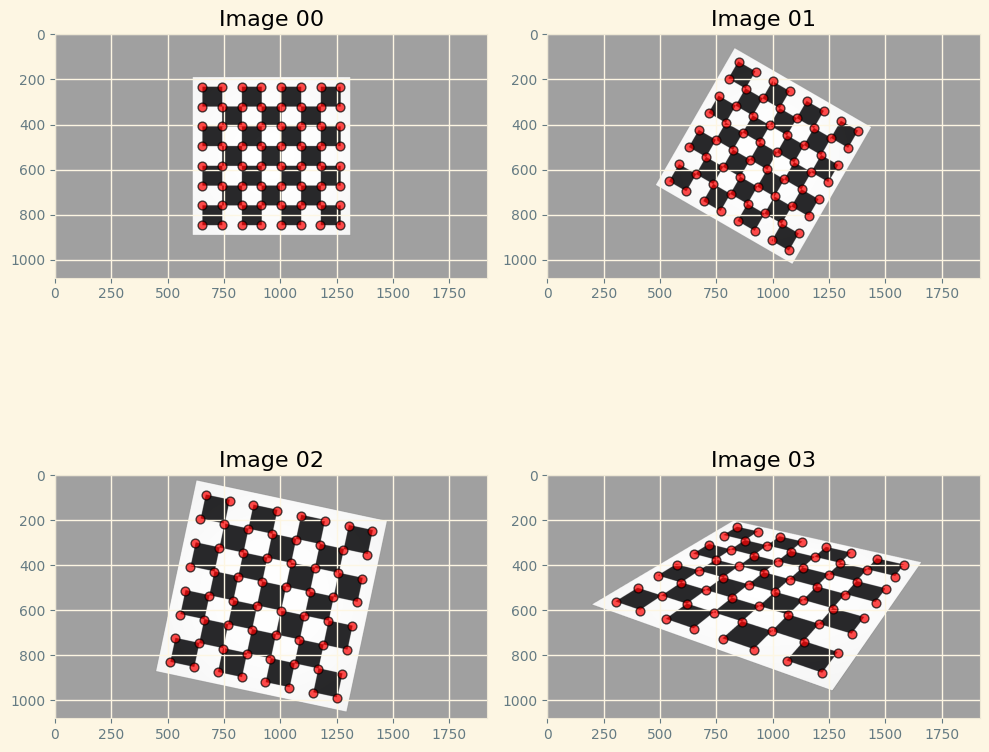

In [ ]:
import cv2
import pandas as pd
import matplotlib.pyplot as plt

def load_keypoints_from_csv(csv_path):
    """Load keypoints from a CSV file."""
    df = pd.read_csv(csv_path, header=None)
    keypoints = df.values  # Assume the CSV has two columns: x, y
    return keypoints


# Create a function to plot the scatter points on the image
def plot_keypoints_on_image(img, keypoints, ax):
    """Plot the keypoints as scatter points on the image."""
    # Convert the image from BGR to RGB for plotting with matplotlib

    # Extract x and y coordinates from keypoints
    x_coords = keypoints[:, 0]
    y_coords = keypoints[:, 1]

    # Plot the image
    ax.imshow(img)

    # Plot keypoints as red scatter points
    ax.scatter(x_coords, y_coords, color='red', s=40, edgecolor='black', alpha=0.7)  # s is size of points
    ax.set_title('Keypoints')

# Set up the plot
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

# Plot keypoints on each image
plot_keypoints_on_image(img00c, keypoints_00, axs[0, 0])
axs[0, 0].set_title('Image 00')

plot_keypoints_on_image(img01c, keypoints_01, axs[0, 1])
axs[0, 1].set_title('Image 01')

plot_keypoints_on_image(img02c, keypoints_02, axs[1, 0])
axs[1, 0].set_title('Image 02')

plot_keypoints_on_image(img03c, keypoints_03, axs[1, 1])
axs[1, 1].set_title('Image 03')

plt.tight_layout()
plt.show()


## Compute Homography

Implement the function:

H = computeHomography(features, matches, model)

where model can be ('Euclidean', 'Similarity', 'Affine', 'Porjective')

follow your notes from MIRA lessons, don't use any opencv existing function

## The matches of this code are being done inside the function, so only the keypoints from each image and the model are necessary as input parameters

In [ ]:
#implement function by ourselves
# Euclidian only translation
# trans + scale
# affine -> rotation and some shear
# projective -> all freedom

In [ ]:
from scipy.optimize import least_squares

In [ ]:
import numpy as np

def compute_homography(points_src, points_dst, model="projective"):
    """
    Computes the homography matrix for the specified model.

    Parameters:
    - points_src: Source points, a list of (x, y) tuples or a Nx2 numpy array.
    - points_dst: Destination points, a list of (x, y) tuples or a Nx2 numpy array.
    - model: The transformation model ("euclidean", "similarity", "affine", "projective").

    Returns:
    - H: The computed homography matrix.
    """
    assert len(points_src) == len(points_dst), "Number of source and destination points must match."
    assert len(points_src) >= 4, "At least 4 point correspondences are required for a projective model."

    points_src = np.asarray(points_src, dtype=np.float64)
    points_dst = np.asarray(points_dst, dtype=np.float64)

    if model == "euclidean":
        # Initial guess for parameters [theta, tx, ty]
        initial_params = [0, 0, 0]  # [theta, tx, ty]

        # Residual function
        def residuals(params, points_src, points_dst):
            theta, tx, ty = params
            cos_theta = np.cos(theta)
            sin_theta = np.sin(theta)
            H = np.array([
                [cos_theta, -sin_theta, tx],
                [sin_theta,  cos_theta, ty],
                [0,          0,         1]
            ])
            points_src_h = np.hstack((points_src, np.ones((points_src.shape[0], 1))))
            points_transformed = (H @ points_src_h.T).T
            points_transformed = points_transformed[:, :2] / points_transformed[:, 2, np.newaxis]
            return (points_transformed - points_dst).ravel()

        # Optimize
        result = least_squares(residuals, initial_params, args=(points_src, points_dst))

        theta_opt, tx_opt, ty_opt = result.x
        cos_theta = np.cos(theta_opt)
        sin_theta = np.sin(theta_opt)
        H = np.array([
            [cos_theta, -sin_theta, tx_opt],
            [sin_theta,  cos_theta, ty_opt],
            [0,          0,      1]
            ])

    elif model == "similarity":
        # Matrix A should now handle uniform scaling and rotation
        A = []
        B = []
        for (x, y), (x_prime, y_prime) in zip(points_src, points_dst):
            A.append([x, -y, 1, 0])
            A.append([y,  x, 0, 1])
            B.extend([x_prime, y_prime])
        A = np.array(A)
        B = np.array(B)

        # Solve for parameters
        params, _, _, _ = np.linalg.lstsq(A, B, rcond=None)
        s = np.hypot(params[0], params[1])  # uniform scaling
        theta = np.arctan2(params[1], params[0])  # rotation angle

        # Construct the similarity matrix
        H = np.array([
            [s * np.cos(theta), -s * np.sin(theta), params[2]],
            [s * np.sin(theta),  s * np.cos(theta), params[3]],
            [0,                 0,                  1]
        ])

    elif model == "affine":
        # Construct matrix A
        A = []
        B = []
        for (x, y), (x_prime, y_prime) in zip(points_src, points_dst):
            A.append([x, y, 1, 0, 0, 0])
            A.append([0, 0, 0, x, y, 1])
            B.extend([x_prime, y_prime])
        A = np.array(A)
        B = np.array(B)

        # Solve for parameters
        params, _, _, _ = np.linalg.lstsq(A, B, rcond=None)

        # Construct the affine transformation matrix
        H = np.array([
            [params[0], params[1], params[2]],
            [params[3], params[4], params[5]],
            [0,         0,         1]
        ])

    elif model == "projective":
        # Projective model
        A = []
        for (x, y), (x_prime, y_prime) in zip(points_src, points_dst):
            A.append([-x, -y, -1,  0,  0,  0, x * x_prime, y * x_prime, x_prime])
            A.append([ 0,  0,  0, -x, -y, -1, x * y_prime, y * y_prime, y_prime])
        A = np.array(A)
        _, _, Vt = np.linalg.svd(A)
        H = Vt[-1].reshape(3, 3)
        H = H / H[2, 2]  # Normalize

    else:
        raise ValueError(f"Unknown model: {model}")

    return H


In [ ]:
def warp_image(src_image, H, dst_shape):
    """Apply a homography to warp the source image to the destination shape."""
    warped_image = cv2.warpPerspective(src_image, H, (dst_shape[1], dst_shape[0]))
    return warped_image


In [ ]:
def apply_homography(points, H):
    """
    Apply homography transformation to a set of points.

    Parameters:
    - points: Nx2 numpy array of (x, y) coordinates.
    - H: 3x3 homography matrix.

    Returns:
    - Transformed points as Nx2 numpy array.
    """
    # Convert points to homogeneous coordinates by adding a third coordinate of 1
    points_homogeneous = np.hstack([points, np.ones((points.shape[0], 1))])

    # Apply the homography transformation
    transformed_points_homogeneous = (H @ points_homogeneous.T).T

    # Convert back to Cartesian coordinates by dividing by the last coordinate
    transformed_points = transformed_points_homogeneous[:, :2] / transformed_points_homogeneous[:, 2, np.newaxis]
    return transformed_points

##Compute Eucliedean Homography

Compute the Euclidean Homography between all loaded images

After computing them use the function `cv2.warpPerspective` to check the obtainen result

The following code we include it to make sure the points matched, and no additional matching function will be needed.

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Convert images to RGB for Matplotlib compatibility
img00c_rgb = cv2.cvtColor(img00c, cv2.COLOR_BGR2RGB)
img01c_rgb = cv2.cvtColor(img01c, cv2.COLOR_BGR2RGB)

# Concatenate images horizontally for side-by-side display
height = max(img00c_rgb.shape[0], img01c_rgb.shape[0])
width = img00c_rgb.shape[1] + img01c_rgb.shape[1]
concatenated_img = np.zeros((height, width, 3), dtype=np.uint8)
concatenated_img[:img00c_rgb.shape[0], :img00c_rgb.shape[1]] = img00c_rgb
concatenated_img[:img01c_rgb.shape[0], img00c_rgb.shape[1]:] = img01c_rgb

# Generate a color map with as many colors as there are matching points
num_matches = min(len(keypoints_00), len(keypoints_01))
colors = cm.rainbow(np.linspace(0, 1, num_matches))

# Plot matching points with different colors
fig, ax = plt.subplots(figsize=(15, 10))
ax.imshow(concatenated_img)
ax.set_title("Matching Points Between Image 00 and Image 01")
ax.axis("off")

# Offset for the second image
offset_x = img00c_rgb.shape[1]

# Plot lines between matching points with different colors
for i, (pt1, pt2) in enumerate(zip(keypoints_00, keypoints_01)):
    x1, y1 = pt1  # Point in img00c
    x2, y2 = pt2  # Point in img01c
    color = colors[i]  # Get a unique color for this match
    ax.plot([x1, x2 + offset_x], [y1, y2], color=color, linewidth=1)  # Draw line between points
    ax.plot(x1, y1, 'o', color=color, markersize=5)  # Mark keypoint in img00c
    ax.plot(x2 + offset_x, y2, 'o', color=color, markersize=5)  # Mark corresponding keypoint in img01c

plt.show()


In [ ]:
H = compute_homography(keypoints_00, keypoints_01, model="euclidean")
warped_image = warp_image(img00c, H, img01c.shape)
transformed_keypoints = apply_homography(keypoints_00, H)
print(f"output_shape {warped_image.shape}")
print(f"Image 0 shape: {img00c.shape}")
print(f"Image 1 shape: {img01c.shape}")


# Display the images
plt.figure(figsize=(15, 10))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img00c, cv2.COLOR_BGR2RGB))
plt.title("Source Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(img01c, cv2.COLOR_BGR2RGB))
plt.title("Destination Image")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB))
plt.scatter(transformed_keypoints[:, 0], transformed_keypoints[:, 1], color='red', marker='x', s=20, label="Transformed Keypoints")
plt.title("Warped Source Image")
plt.axis('off')

plt.show()

##Compute Similarity Homography
Compute the Similarity Homography between all loaded images

After computing them use the function `cv2.warpPerspective` to check the obtainen result

In [ ]:
H = compute_homography(keypoints_00, keypoints_03, model="similarity")
warped_image = warp_image(img00c, H, img03c.shape)
transformed_keypoints = apply_homography(keypoints_00, H)
print(f"output_shape {warped_image.shape}")
print(f"Image 0 shape: {img00c.shape}")
print(f"Image 1 shape: {img01c.shape}")


# Display the images
plt.figure(figsize=(15, 10))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img00c, cv2.COLOR_BGR2RGB))
plt.title("Source Image img00c")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(img03c, cv2.COLOR_BGR2RGB))
plt.title("Destination Image img03c")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB))
plt.scatter(transformed_keypoints[:, 0], transformed_keypoints[:, 1], color='red', marker='x', s=20, label="Transformed Keypoints")
plt.title("Warped Source  img00c Image to img03c")
plt.axis('off')

plt.show()

##Compute Affine Homography

Compute the Affine Homography between all loaded images

After computing them use the function `cv2.warpPerspective` to check the obtainen result

In [ ]:
H = compute_homography(keypoints_00, keypoints_03, model="affine")
warped_image = warp_image(img00c, H, img03c.shape)
transformed_keypoints = apply_homography(keypoints_00, H)
print(f"output_shape {warped_image.shape}")
print(f"Image 0 shape: {img00c.shape}")
print(f"Image 1 shape: {img01c.shape}")


# Display the images
plt.figure(figsize=(15, 10))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img00c, cv2.COLOR_BGR2RGB))
plt.title("Source Image img00c")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(img03c, cv2.COLOR_BGR2RGB))
plt.title("Destination Image img03c")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB))
plt.scatter(transformed_keypoints[:, 0], transformed_keypoints[:, 1], color='red', marker='x', s=20, label="Transformed Keypoints")
plt.title("Warped Source Image img00c to img03c")
plt.axis('off')

plt.show()

##Compute Projective Homography

Compute the Euclidean Homography between all loaded images

After computing them use the function `cv2.warpPerspective` to check the obtainen result

In [ ]:
H = compute_homography(keypoints_00, keypoints_03, model="projective")
warped_image = warp_image(img00c, H, img03c.shape)
transformed_keypoints = apply_homography(keypoints_00, H)
print(f"output_shape {warped_image.shape}")
print(f"Image 0 shape: {img00c.shape}")
print(f"Image 1 shape: {img01c.shape}")


# Display the images
plt.figure(figsize=(15, 10))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img00c, cv2.COLOR_BGR2RGB))
plt.title("Source Image img00c")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(img03c, cv2.COLOR_BGR2RGB))
plt.title("Destination Image img03c")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB))
plt.scatter(transformed_keypoints[:, 0], transformed_keypoints[:, 1], color='red', marker='x', s=20, label="Transformed Keypoints")
plt.title("Warped Source Image img00c to img03c")
plt.axis('off')

plt.show()

# Code to check all the possible combination of images

In [ ]:
def compute_and_display_homography(src_image, dst_image, src_keypoints, dst_keypoints, src_num, dst_num, model="projective"):
    """
    Computes the homography matrix, applies it to warp the source image,
    transforms the source keypoints, and displays the results with image numbers.
    Parameters:
    - src_image: Source image.
    - dst_image: Destination image.
    - src_keypoints: Keypoints in the source image (Nx2 array).
    - dst_keypoints: Keypoints in the destination image (Nx2 array).
    - src_num: Source image number.
    - dst_num: Destination image number.
    - model: Type of homography model ("euclidean", "similarity", "affine", "projective").
    """
    # Compute the homography matrix
    H = compute_homography(src_keypoints, dst_keypoints, model=model)

    # Warp the source image to align with the destination image
    warped_image = warp_image(src_image, H, dst_image.shape)

    # Transform the source keypoints using the homography
    transformed_keypoints = apply_homography(src_keypoints, H)

    # Display the images
    plt.figure(figsize=(15, 10))

    # Source image with keypoints
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(src_image, cv2.COLOR_BGR2RGB))
    plt.scatter(src_keypoints[:, 0], src_keypoints[:, 1], color='yellow', marker='o', s=20, label="Source Keypoints")
    plt.title(f"Source Image {src_num}")
    plt.axis('off')

    # Destination image with keypoints
    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(dst_image, cv2.COLOR_BGR2RGB))
    plt.scatter(dst_keypoints[:, 0], dst_keypoints[:, 1], color='cyan', marker='o', s=20, label="Destination Keypoints")
    plt.title(f"Destination Image {dst_num}")
    plt.axis('off')

    # Warped source image with transformed keypoints
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB))
    plt.scatter(transformed_keypoints[:, 0], transformed_keypoints[:, 1], color='red', marker='x', s=20, label="Transformed Keypoints")
    plt.title(f"Warped Source Image {src_num} to {dst_num}")
    plt.axis('off')

    plt.show()

    return warped_image, transformed_keypoints

Processing Source Image 00 and Destination Image 01
--------------------------------------------------------------Euclidean---------------------------------------------------------------


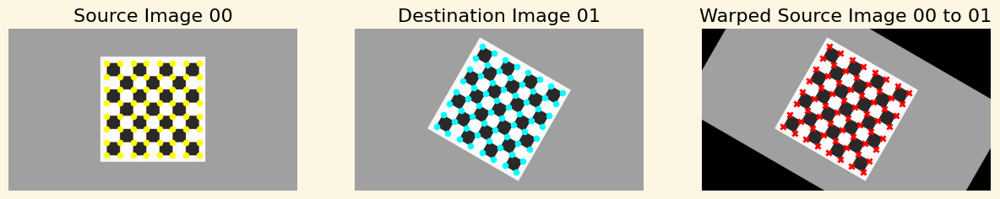

--------------------------------------------------------------Similarity--------------------------------------------------------------


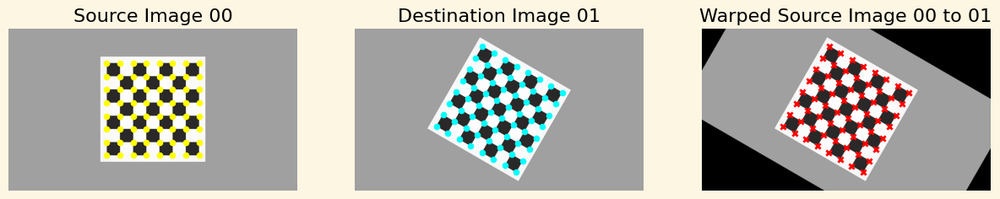

----------------------------------------------------------------Affine----------------------------------------------------------------


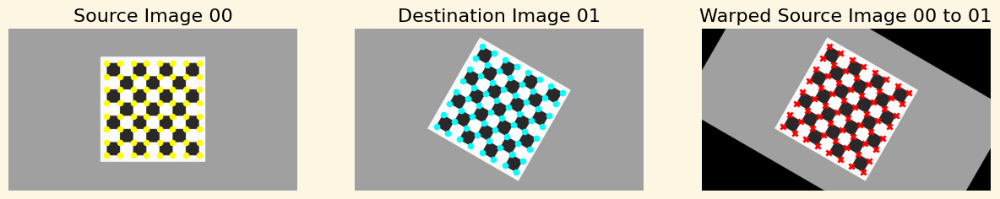

--------------------------------------------------------------projective--------------------------------------------------------------


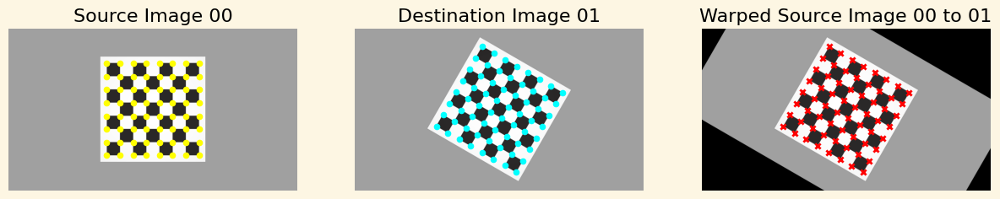

Processing Source Image 00 and Destination Image 02
--------------------------------------------------------------Euclidean---------------------------------------------------------------


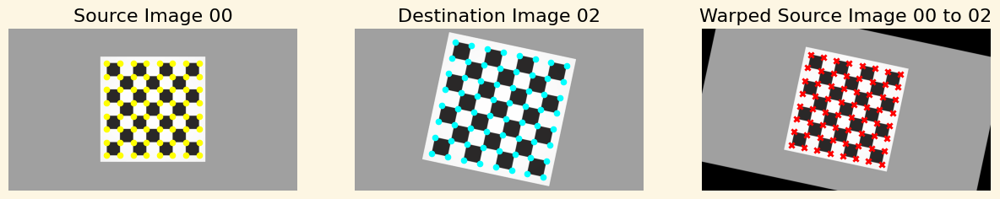

--------------------------------------------------------------Similarity--------------------------------------------------------------


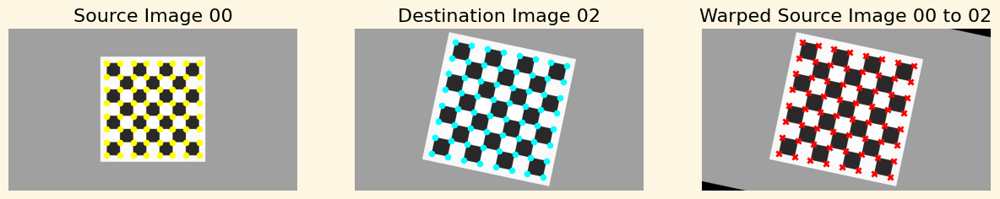

----------------------------------------------------------------Affine----------------------------------------------------------------


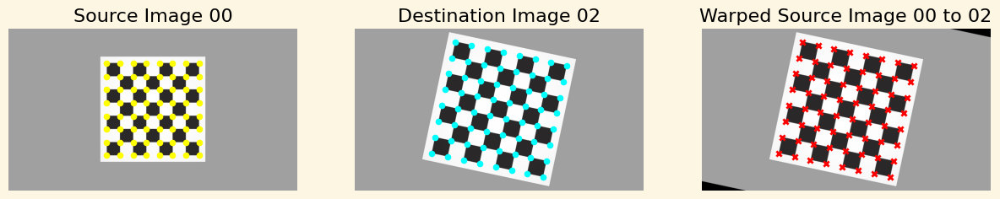

--------------------------------------------------------------projective--------------------------------------------------------------


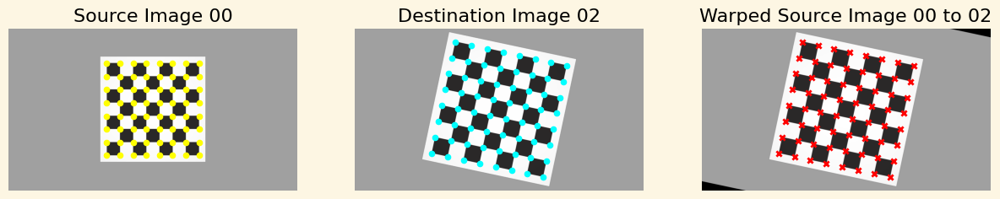

Processing Source Image 00 and Destination Image 03
--------------------------------------------------------------Euclidean---------------------------------------------------------------


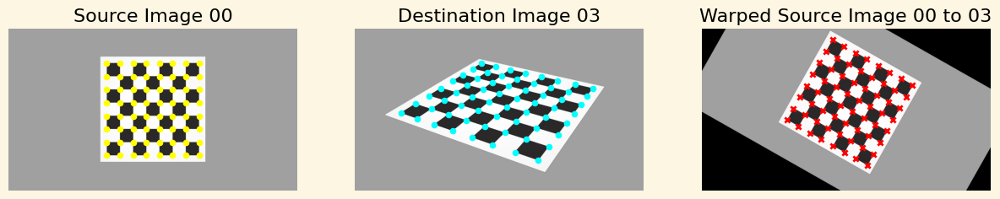

--------------------------------------------------------------Similarity--------------------------------------------------------------


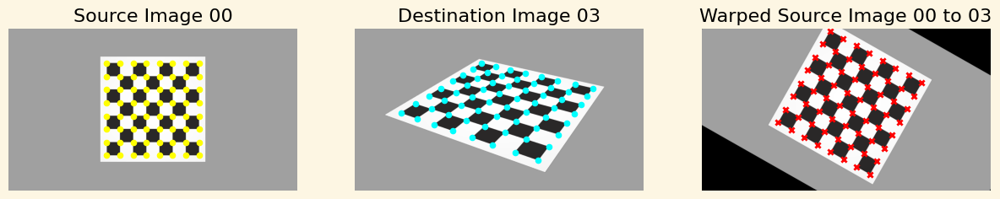

----------------------------------------------------------------Affine----------------------------------------------------------------


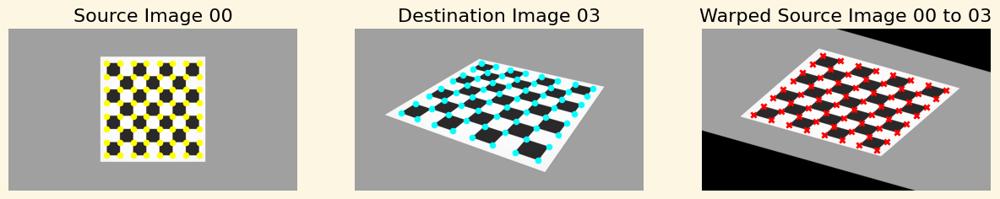

--------------------------------------------------------------projective--------------------------------------------------------------


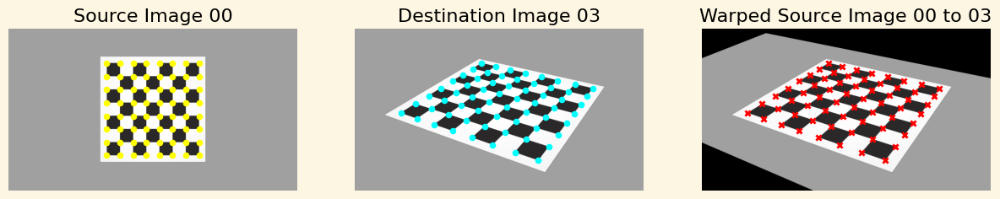

Processing Source Image 01 and Destination Image 00
--------------------------------------------------------------Euclidean---------------------------------------------------------------


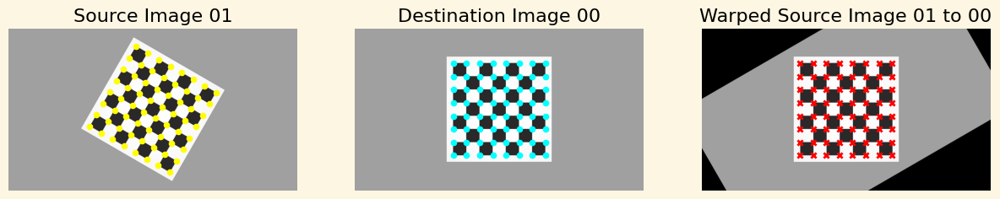

--------------------------------------------------------------Similarity--------------------------------------------------------------


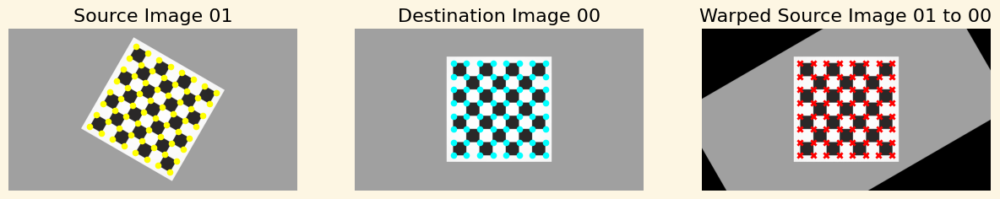

----------------------------------------------------------------Affine----------------------------------------------------------------


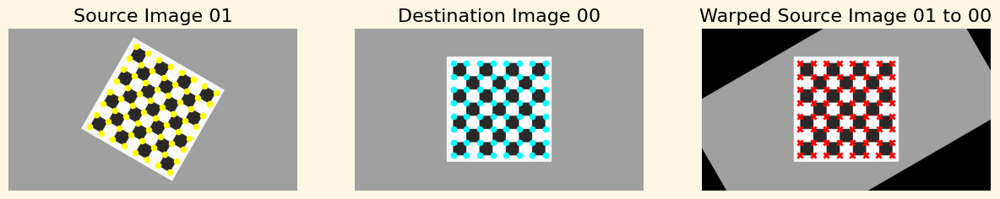

--------------------------------------------------------------projective--------------------------------------------------------------


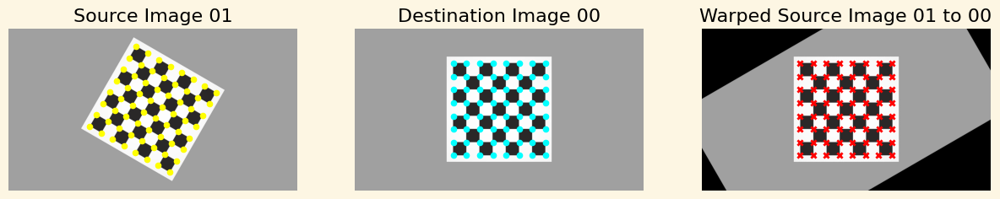

Processing Source Image 01 and Destination Image 02
--------------------------------------------------------------Euclidean---------------------------------------------------------------


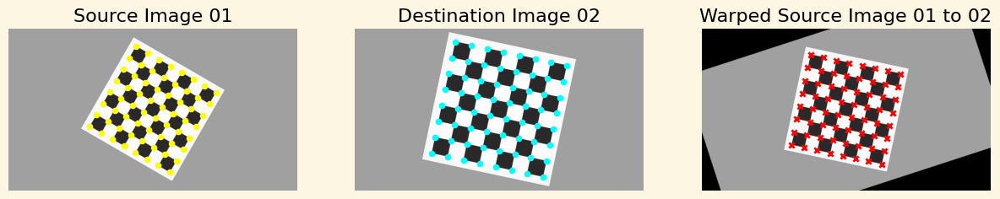

--------------------------------------------------------------Similarity--------------------------------------------------------------


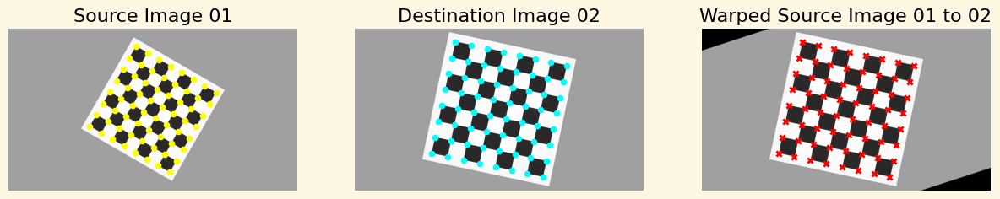

----------------------------------------------------------------Affine----------------------------------------------------------------


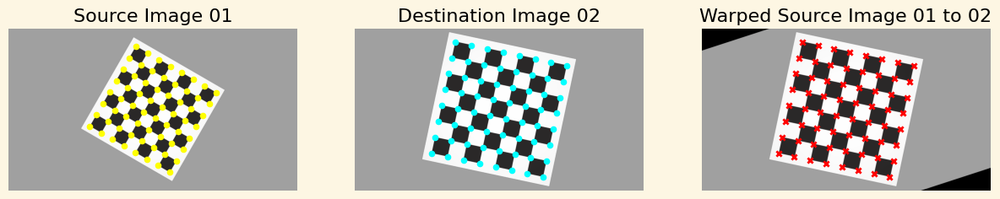

--------------------------------------------------------------projective--------------------------------------------------------------


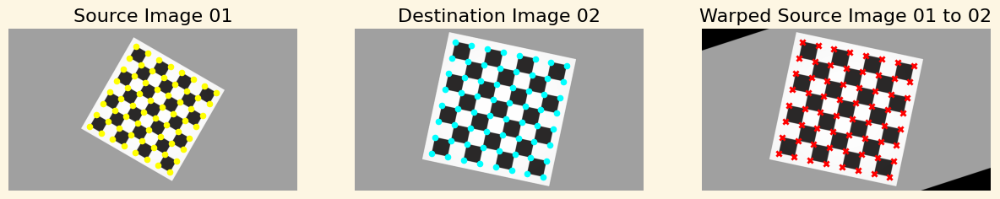

Processing Source Image 01 and Destination Image 03
--------------------------------------------------------------Euclidean---------------------------------------------------------------


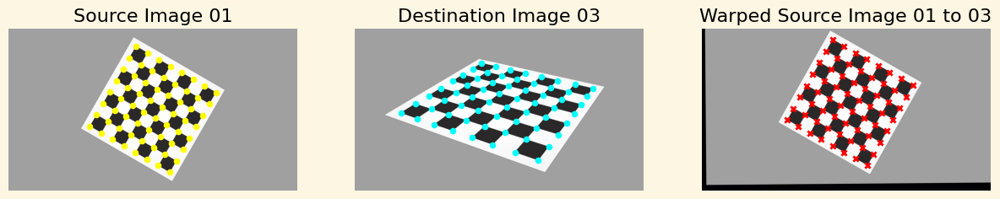

--------------------------------------------------------------Similarity--------------------------------------------------------------


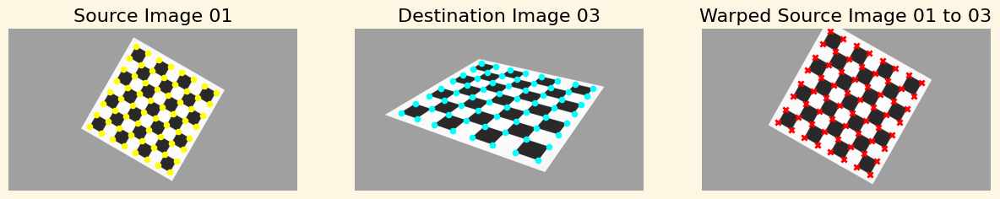

----------------------------------------------------------------Affine----------------------------------------------------------------


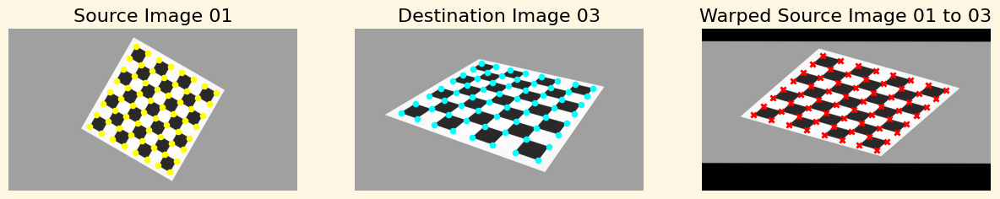

--------------------------------------------------------------projective--------------------------------------------------------------


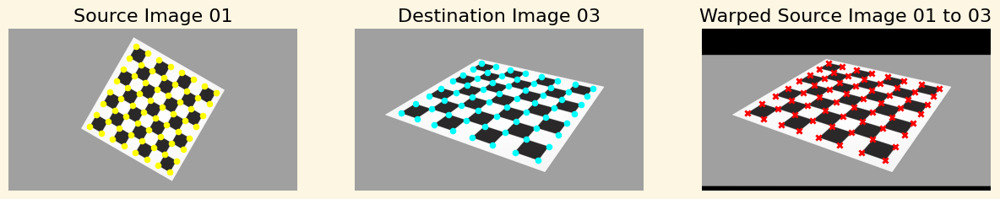

Processing Source Image 02 and Destination Image 00
--------------------------------------------------------------Euclidean---------------------------------------------------------------


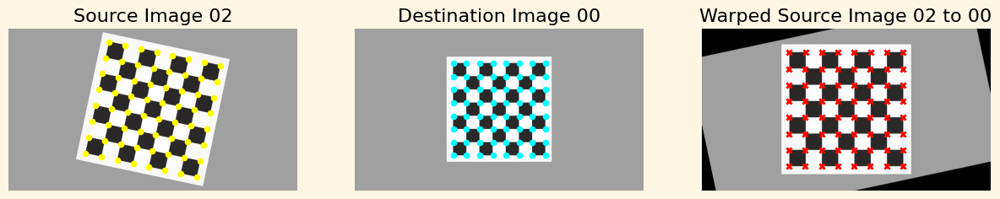

--------------------------------------------------------------Similarity--------------------------------------------------------------


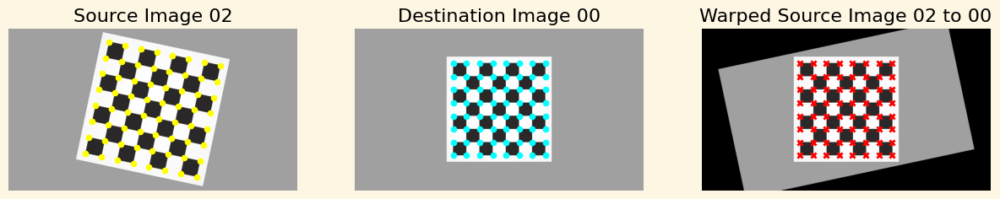

----------------------------------------------------------------Affine----------------------------------------------------------------


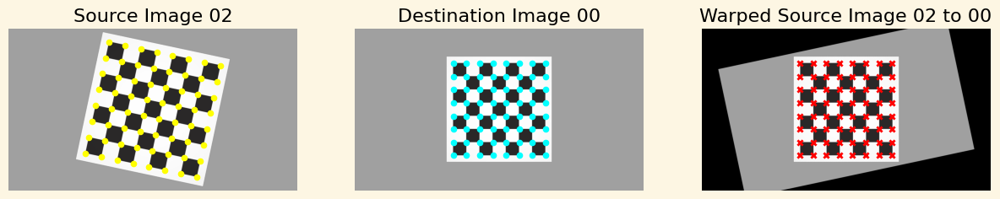

--------------------------------------------------------------projective--------------------------------------------------------------


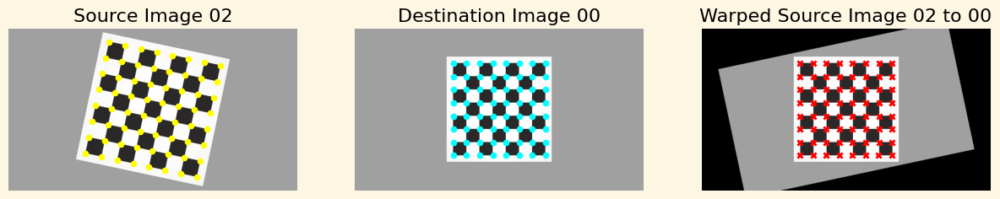

Processing Source Image 02 and Destination Image 01
--------------------------------------------------------------Euclidean---------------------------------------------------------------


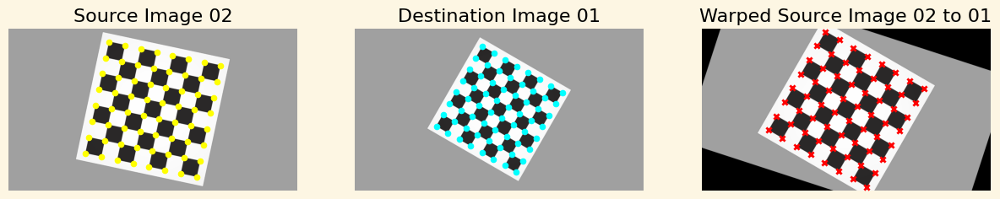

--------------------------------------------------------------Similarity--------------------------------------------------------------


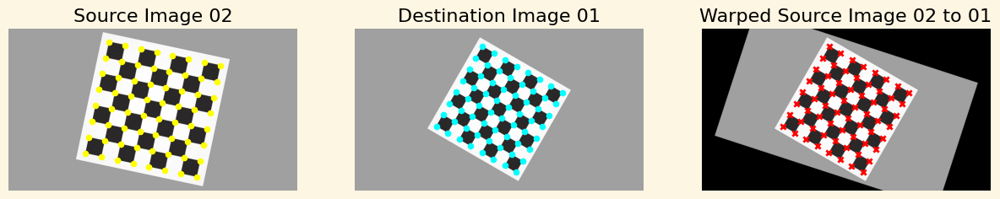

----------------------------------------------------------------Affine----------------------------------------------------------------


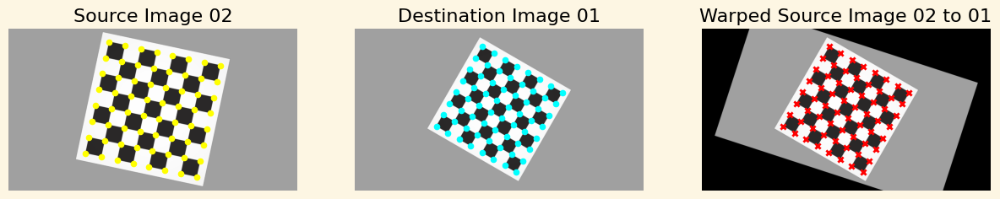

--------------------------------------------------------------projective--------------------------------------------------------------


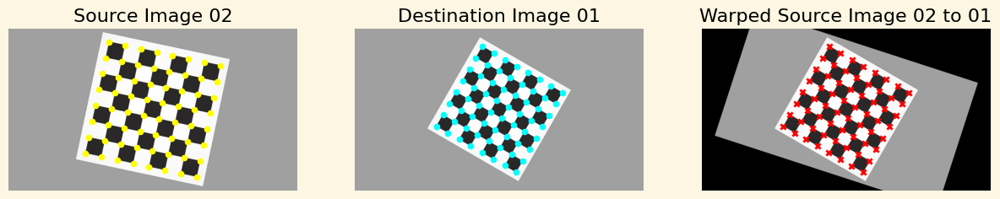

Processing Source Image 02 and Destination Image 03
--------------------------------------------------------------Euclidean---------------------------------------------------------------


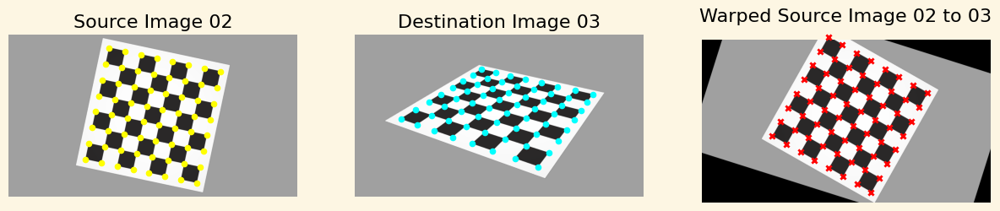

--------------------------------------------------------------Similarity--------------------------------------------------------------


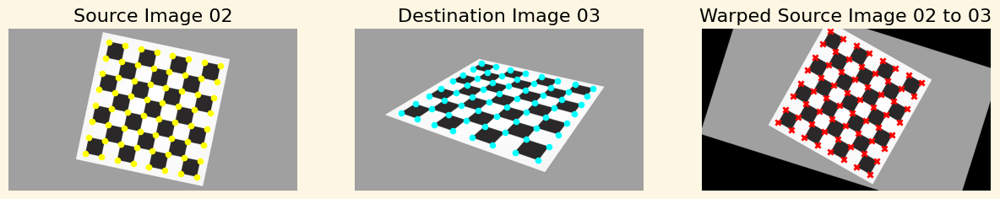

----------------------------------------------------------------Affine----------------------------------------------------------------


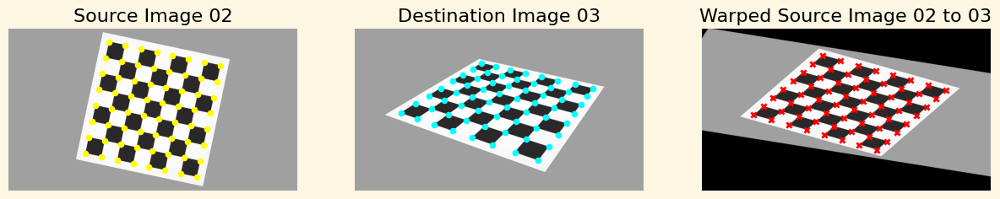

--------------------------------------------------------------projective--------------------------------------------------------------


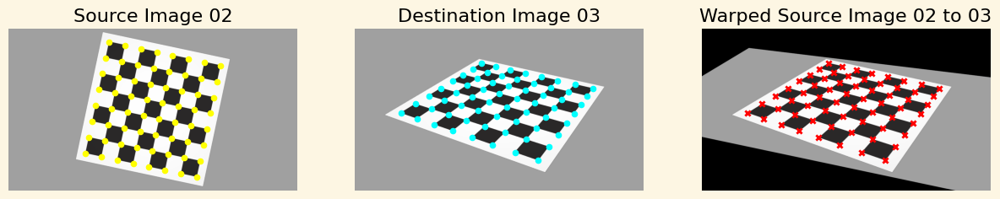

Processing Source Image 03 and Destination Image 00
--------------------------------------------------------------Euclidean---------------------------------------------------------------


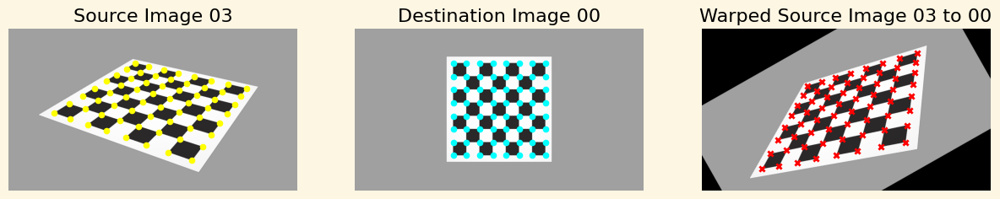

--------------------------------------------------------------Similarity--------------------------------------------------------------


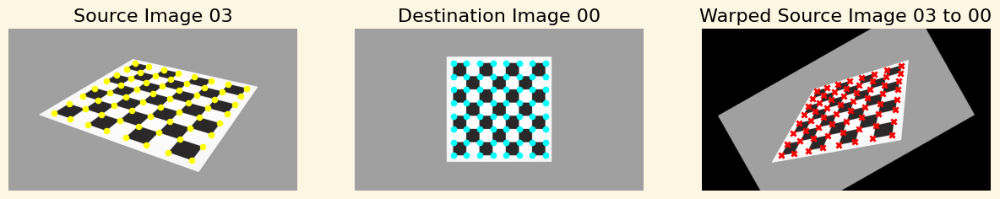

----------------------------------------------------------------Affine----------------------------------------------------------------


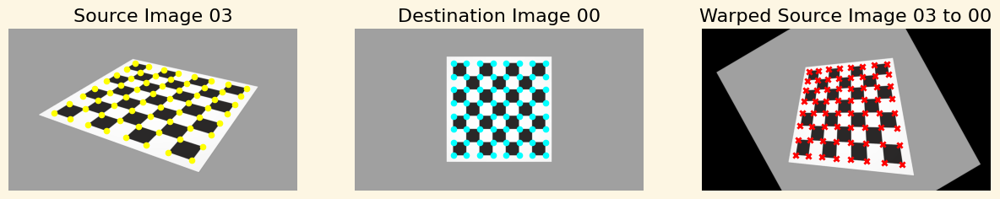

--------------------------------------------------------------projective--------------------------------------------------------------


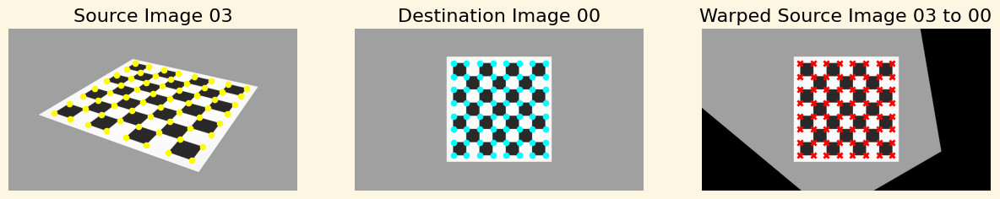

Processing Source Image 03 and Destination Image 01
--------------------------------------------------------------Euclidean---------------------------------------------------------------


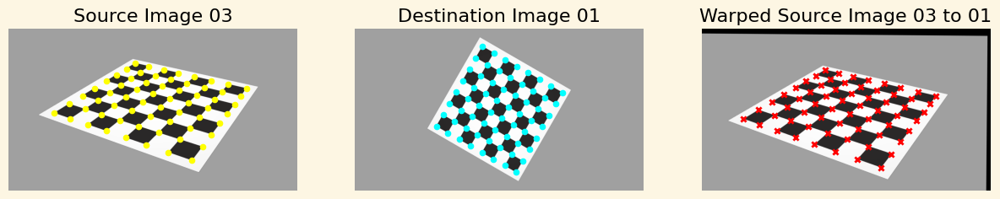

--------------------------------------------------------------Similarity--------------------------------------------------------------


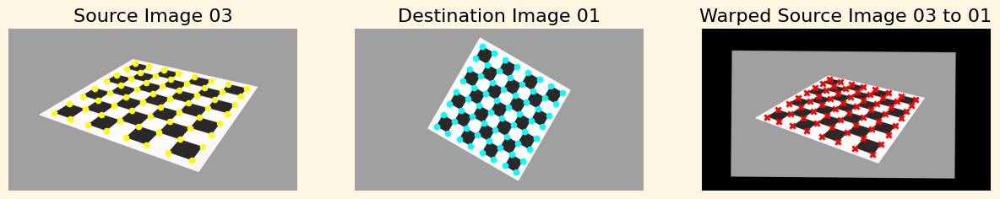

----------------------------------------------------------------Affine----------------------------------------------------------------


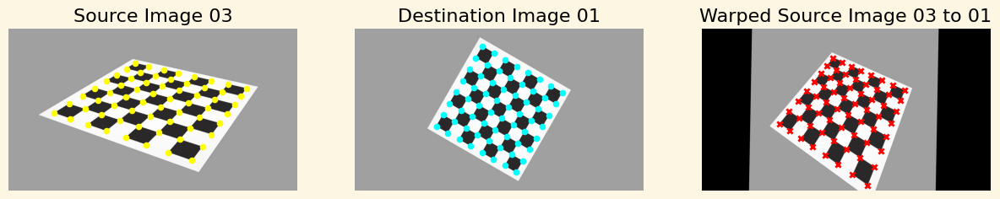

--------------------------------------------------------------projective--------------------------------------------------------------


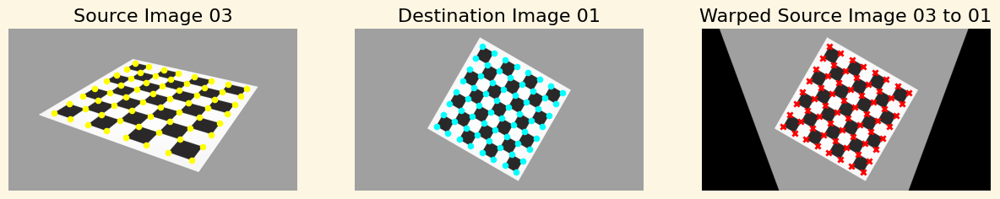

Processing Source Image 03 and Destination Image 02
--------------------------------------------------------------Euclidean---------------------------------------------------------------


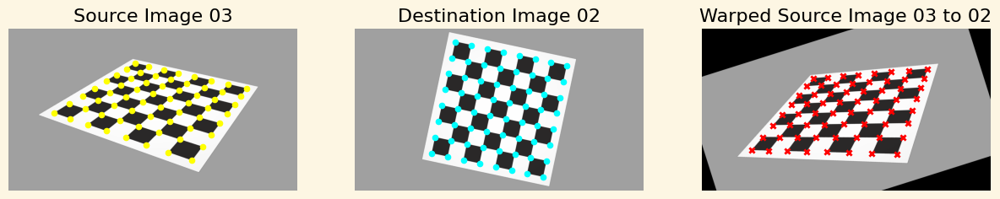

--------------------------------------------------------------Similarity--------------------------------------------------------------


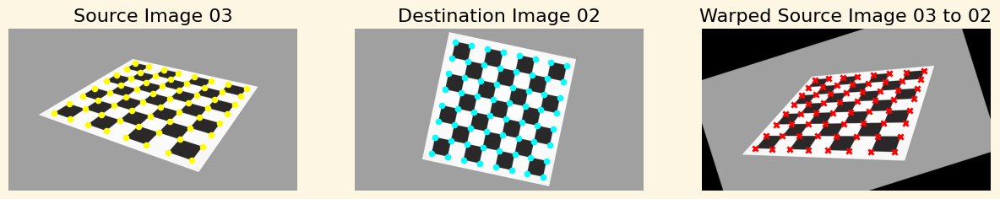

----------------------------------------------------------------Affine----------------------------------------------------------------


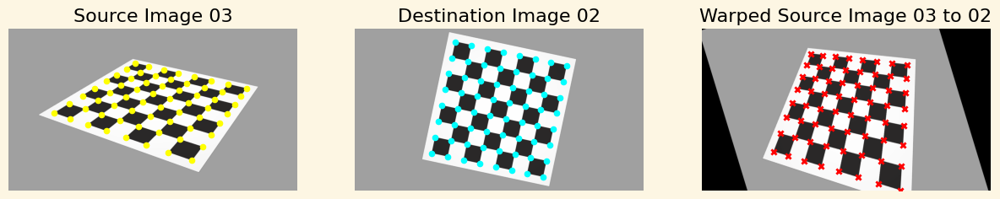

--------------------------------------------------------------projective--------------------------------------------------------------


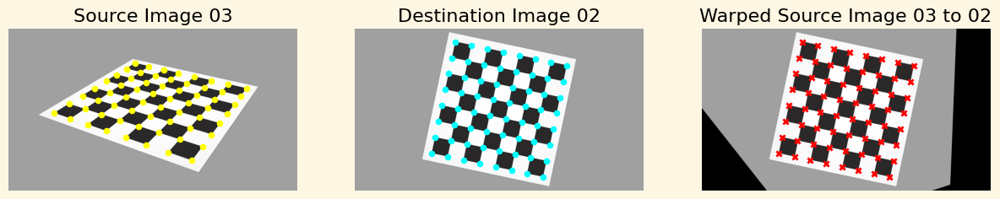

In [ ]:
import itertools
import numpy as np
import cv2
import matplotlib.pyplot as plt


# Define images and their keypoints
images = [
    (img00c, keypoints_00, "00"),
    (img01c, keypoints_01, "01"),
    (img02c, keypoints_02, "02"),
    (img03c, keypoints_03, "03")
]

# Generate all possible pairs of images and keypoints
for (src_img, src_kp, src_num), (dst_img, dst_kp, dst_num) in itertools.permutations(images, 2):
    print(f"Processing Source Image {src_num} and Destination Image {dst_num}")
    print("--------------------------------------------------------------Euclidean---------------------------------------------------------------")
    warped_img, transformed_kp = compute_and_display_homography(src_img, dst_img, src_kp, dst_kp, src_num, dst_num, model="euclidean")
    print("--------------------------------------------------------------Similarity--------------------------------------------------------------")
    warped_img, transformed_kp = compute_and_display_homography(src_img, dst_img, src_kp, dst_kp, src_num, dst_num, model="similarity")
    print("----------------------------------------------------------------Affine----------------------------------------------------------------")
    warped_img, transformed_kp = compute_and_display_homography(src_img, dst_img, src_kp, dst_kp, src_num, dst_num, model="affine")
    print("--------------------------------------------------------------projective--------------------------------------------------------------")
    warped_img, transformed_kp = compute_and_display_homography(src_img, dst_img, src_kp, dst_kp, src_num, dst_num, model="projective")

##Comment the previous obtained results.

Which is the best homography for each image pair? Why?

## Best Homography for Each Image Pair

### $\color{red}{\text{00 and 01}}$
$\color{red}{\text{The Euclidean model is enough to align the frames since they have similar scale and the only difference is a rotation.}}$

$\color{red}{\text{More complex models handle the task easily since the transformation involves only rotation and translation.}}$

### $\color{red}{\text{00 and 02}}$
$\color{red}{\text{All models succeed due to the low complexity of the transformation.}}$  

### $\color{red}{\text{00 and 03}}$
$\color{red}{\text{A significant increase in transformation complexity is needed as image 03 has a different perspective.}}$  
$\color{red}{\text{Projective transformations are necessary to account for rotation, translation, scaling, shearing, and perspective distortion.}}$

### $\color{red}{\text{01 and 00}}$
$\color{red}{\text{Similar results as 00 and 01: the Euclidean model is sufficient and more complex models perform well.}}$

### $\color{red}{\text{01 and 02}}$
$\color{red}{\text{Images differ in scaling despite similar rotation and translation, making similarity, affine, and projective models the best choices.}}$

### $\color{red}{\text{01 and 03}}$
$\color{red}{\text{Image 03's distinct perspective requires the projective model, as other transformations fail to match the intrinsic projection.}}$

### $\color{red}{\text{02 and 00}}$
$\color{red}{\text{Similar to previous cases: the Euclidean model fails due to differences in scale, while all other models succeed.}}$

### $\color{red}{\text{02 and 01}}$
$\color{red}{\text{Results are consistent with 01 and 02: similarity, affine, and projective models are the best options.}}$

### $\color{red}{\text{02 and 03}}$
$\color{red}{\text{Same results as 01 and 03, requiring the projective model.}}$

### $\color{red}{\text{03 and Other Images (00, 01, 02)}}$
$\color{red}{\text{Image 03 presents the highest complexity due to rotation, translation, scaling, shearing, and perspective distortion.}}$  
$\color{red}{\text{Only the projective model can handle the transformations required to align keypoints effectively.}}$

## $\color{red}{\text{Conclusion}}$
$\color{red}{\text{Choosing the Appropriate Transformation Model}}$  
$\color{red}{\text{The decision on the type of transformation model depends on the complexity of the image pair's relationship and the transformations required to align them effectively:}}$

### $\color{red}{\text{Euclidean Transformation}}$
$\color{red}{\text{Best suited for cases where only rotation and translation are needed, like between image 00 and image 02.}}$  
$\color{red}{\text{Ineffective for images with differences in scale, shearing, or perspective distortion.}}$

### $\color{red}{\text{Similarity Transformation}}$
$\color{red}{\text{Extends the Euclidean model by incorporating uniform scaling along with rotation and translation, which seemed to work in almost any image combination as long as there was no need for perspective or shearing transformation.}}$  
$\color{red}{\text{Works well when images differ in size but maintain the same proportions.}}$

### $\color{red}{\text{Affine Transformation}}$
$\color{red}{\text{Handles more complex transformations, including shearing, scaling, rotation, and translation.}}$  
$\color{red}{\text{Suitable when the geometry of the images changes due to linear transformations, but no perspective distortion is present, like image 02 and 01 or 02 and 00.}}$

### $\color{red}{\text{Projective Transformation (Best for these images)}}$
$\color{red}{\text{The most versatile model, capable of managing perspective distortion in addition to scaling, rotation, translation, and shearing.}}$  
$\color{red}{\text{Essential for aligning images captured from significantly different viewpoints or planes. For instance, this must be the transformation to go with if we want to work with images like image 03.}}$

## Compute Homography with skin images

Now Compute the Homography between the 2 skin images used during the first sesion using your Homography Computation function. Use all models and and compare the results

In [ ]:
import itertools
img1 = train_img
img2 = query_img

points1 = np.float32([keypoints1[m.queryIdx].pt for m in good_matches])
points2 = np.float32([keypoints2[m.trainIdx].pt for m in good_matches])

images = [
    (img1, points1, "img1"),
    (img2, points2, "img2")
]

for (src_img, src_kp, src_num), (dst_img, dst_kp, dst_num) in itertools.permutations(images, 2):
    print(f"Processing Source Image {src_num} and Destination Image {dst_num}")
    print("--------------------------------------------------------------Euclidean---------------------------------------------------------------")
    warped_img, transformed_kp = compute_and_display_homography(src_img, dst_img, src_kp, dst_kp, src_num, dst_num, model="euclidean")
    print("--------------------------------------------------------------Similarity--------------------------------------------------------------")
    warped_img, transformed_kp = compute_and_display_homography(src_img, dst_img, src_kp, dst_kp, src_num, dst_num, model="similarity")
    print("----------------------------------------------------------------Affine----------------------------------------------------------------")
    warped_img, transformed_kp = compute_and_display_homography(src_img, dst_img, src_kp, dst_kp, src_num, dst_num, model="affine")
    print("--------------------------------------------------------------projective--------------------------------------------------------------")
    warped_img, transformed_kp = compute_and_display_homography(src_img, dst_img, src_kp, dst_kp, src_num, dst_num, model="projective")

## You should notice that you have outliers when you compute the Homography.

Implement RANSAC function and recompute all the Homographies using it.

Finally Warp one of the images and compare your results with the ones obtained using opencv functions.

# Check distribution for outliers threshold
### Reprojection error
* How well a model fits the data. In this case, the model is the homography.
* Diff between where a point from one image should be in another image, based on the transformation and where it actually ends up when you apply that transformation.

#Euclidean

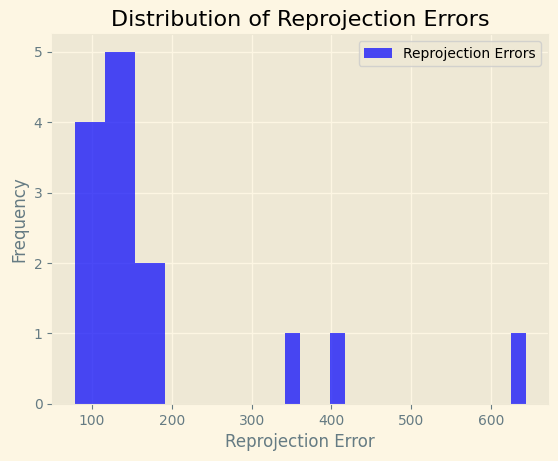

The percentage of outliers is: 12.0%


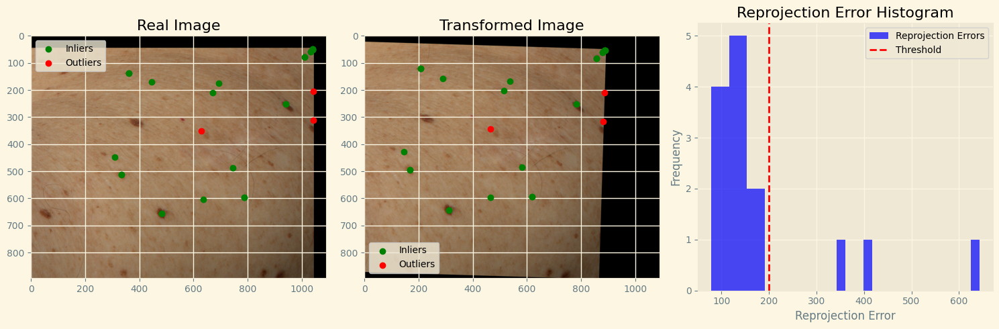

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

def project_points(H, points):
    """
    Projects points using a homography matrix.
    """
    projected_points = []
    for point in points:
        x, y = point
        transformed = np.dot(H, [x, y, 1])  # Apply the homography
        transformed /= transformed[2]      # Normalize by the last coordinate
        projected_points.append(transformed[:2])
    return np.array(projected_points)


# Compute reprojection errors
H = compute_homography(points1, points2, model="euclidean")
projected_points = project_points(H, points1)
reprojection_errors = np.linalg.norm(projected_points - points2, axis=1)



# Plot histogram of reprojection errors
plt.hist(reprojection_errors, bins=30, color='b', alpha=0.7, label='Reprojection Errors')
plt.xlabel('Reprojection Error')
plt.ylabel('Frequency')
plt.title('Distribution of Reprojection Errors')
plt.legend()
plt.show()

#Decide a threshold according to data
threshold = 200.0 #was observed on the data

#To get a percentage of the data
total_points = len(reprojection_errors)

# Number of outliers
outlier_count = np.sum(reprojection_errors >= threshold)

outlier_percentage = (outlier_count / total_points) * 100



print(f"The percentage of outliers is: {outlier_percentage}%")

# Plot inliers and outliers visually
#After checking the histogram, the chosen value for the threshold is 550
inliers_mask = reprojection_errors < threshold
inlier_points = np.array(points1)[inliers_mask]
outlier_points = np.array(points1)[~inliers_mask]

# Warp the image using the homography
warped_img = cv2.warpPerspective(train_img, H, (train_img.shape[1], train_img.shape[0]))

#Transform inlier points

inliers_point1_homogeneous = np.hstack([inlier_points, np.ones((inlier_points.shape[0], 1))])  # Convert to homogeneous coordinates
warped_inliers_point1 = (H @ inliers_point1_homogeneous.T).T  # Apply the homography
warped_inliers_point1 /= warped_inliers_point1[:, 2][:, np.newaxis]

#Transform outlier points

outliers_point1_homogeneous = np.hstack([outlier_points, np.ones((outlier_points.shape[0], 1))])  # Convert to homogeneous coordinates
warped_outliers_point1 = (H @ outliers_point1_homogeneous.T).T  # Apply the homography
warped_outliers_point1 /= warped_outliers_point1[:, 2][:, np.newaxis]



# Create subplots to display the real image, warped image, and points
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Real image with points
axes[0].imshow(cv2.cvtColor(train_img, cv2.COLOR_BGR2RGB))
axes[0].scatter(inlier_points[:, 0], inlier_points[:, 1], color='g', label='Inliers')
axes[0].scatter(outlier_points[:, 0], outlier_points[:, 1], color='r', label='Outliers')
axes[0].legend()
axes[0].set_title('Real Image')

# Transformed image with points
axes[1].imshow(cv2.cvtColor(warped_img, cv2.COLOR_BGR2RGB))
axes[1].scatter(warped_inliers_point1[:, 0], warped_inliers_point1[:, 1], color='g', label='Inliers')
axes[1].scatter(warped_outliers_point1[:, 0], warped_outliers_point1[:, 1], color='r', label='Outliers')
axes[1].legend()
axes[1].set_title('Transformed Image')

# Show the difference or additional information (e.g., histogram, another plot)
axes[2].hist(reprojection_errors, bins=30, color='b', alpha=0.7, label='Reprojection Errors')
axes[2].axvline(threshold, color='r', linestyle='--', label='Threshold')
axes[2].set_xlabel('Reprojection Error')
axes[2].set_ylabel('Frequency')
axes[2].set_title('Reprojection Error Histogram')
axes[2].legend()

plt.tight_layout()
plt.show()


# Similarity

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

def project_points(H, points):
    """
    Projects points using a homography matrix.
    """
    projected_points = []
    for point in points:
        x, y = point
        transformed = np.dot(H, [x, y, 1])  # Apply the homography
        transformed /= transformed[2]      # Normalize by the last coordinate
        projected_points.append(transformed[:2])
    return np.array(projected_points)


# Compute reprojection errors
H = compute_homography(points1, points2, model="similarity")
projected_points = project_points(H, points1)
reprojection_errors = np.linalg.norm(projected_points - points2, axis=1)



# Plot histogram of reprojection errors
plt.hist(reprojection_errors, bins=30, color='b', alpha=0.7, label='Reprojection Errors')
plt.xlabel('Reprojection Error')
plt.ylabel('Frequency')
plt.title('Distribution of Reprojection Errors')
plt.legend()
plt.show()

#Decide a threshold according to data
threshold = 200.0 #was observed on the data

#To get a percentage of the data
total_points = len(reprojection_errors)

# Number of outliers
outlier_count = np.sum(reprojection_errors >= threshold)

outlier_percentage = (outlier_count / total_points) * 100



print(f"The percentage of outliers is: {outlier_percentage}%")

# Plot inliers and outliers visually
#After checking the histogram, the chosen value for the threshold is 550
inliers_mask = reprojection_errors < threshold
inlier_points = np.array(points1)[inliers_mask]
outlier_points = np.array(points1)[~inliers_mask]

# Warp the image using the homography
warped_img = cv2.warpPerspective(train_img, H, (train_img.shape[1], train_img.shape[0]))

#Transform inlier points

inliers_point1_homogeneous = np.hstack([inlier_points, np.ones((inlier_points.shape[0], 1))])  # Convert to homogeneous coordinates
warped_inliers_point1 = (H @ inliers_point1_homogeneous.T).T  # Apply the homography
warped_inliers_point1 /= warped_inliers_point1[:, 2][:, np.newaxis]

#Transform outlier points

outliers_point1_homogeneous = np.hstack([outlier_points, np.ones((outlier_points.shape[0], 1))])  # Convert to homogeneous coordinates
warped_outliers_point1 = (H @ outliers_point1_homogeneous.T).T  # Apply the homography
warped_outliers_point1 /= warped_outliers_point1[:, 2][:, np.newaxis]



# Create subplots to display the real image, warped image, and points
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Real image with points
axes[0].imshow(cv2.cvtColor(train_img, cv2.COLOR_BGR2RGB))
axes[0].scatter(inlier_points[:, 0], inlier_points[:, 1], color='g', label='Inliers')
axes[0].scatter(outlier_points[:, 0], outlier_points[:, 1], color='r', label='Outliers')
axes[0].legend()
axes[0].set_title('Real Image')

# Transformed image with points
axes[1].imshow(cv2.cvtColor(warped_img, cv2.COLOR_BGR2RGB))
axes[1].scatter(warped_inliers_point1[:, 0], warped_inliers_point1[:, 1], color='g', label='Inliers')
axes[1].scatter(warped_outliers_point1[:, 0], warped_outliers_point1[:, 1], color='r', label='Outliers')
axes[1].legend()
axes[1].set_title('Transformed Image')

# Show the difference or additional information (e.g., histogram, another plot)
axes[2].hist(reprojection_errors, bins=30, color='b', alpha=0.7, label='Reprojection Errors')
axes[2].axvline(threshold, color='r', linestyle='--', label='Threshold')
axes[2].set_xlabel('Reprojection Error')
axes[2].set_ylabel('Frequency')
axes[2].set_title('Reprojection Error Histogram')
axes[2].legend()

plt.tight_layout()
plt.show()


# Affine

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

def project_points(H, points):
    """
    Projects points using a homography matrix.
    """
    projected_points = []
    for point in points:
        x, y = point
        transformed = np.dot(H, [x, y, 1])  # Apply the homography
        transformed /= transformed[2]      # Normalize by the last coordinate
        projected_points.append(transformed[:2])
    return np.array(projected_points)


# Compute reprojection errors
H = compute_homography(points1, points2, model="affine")
projected_points = project_points(H, points1)
reprojection_errors = np.linalg.norm(projected_points - points2, axis=1)



# Plot histogram of reprojection errors
plt.hist(reprojection_errors, bins=30, color='b', alpha=0.7, label='Reprojection Errors')
plt.xlabel('Reprojection Error')
plt.ylabel('Frequency')
plt.title('Distribution of Reprojection Errors')
plt.legend()
plt.show()

#Decide a threshold according to data
threshold = 150.0 #was observed on the data

#To get a percentage of the data
total_points = len(reprojection_errors)

# Number of outliers
outlier_count = np.sum(reprojection_errors >= threshold)

outlier_percentage = (outlier_count / total_points) * 100



print(f"The percentage of outliers is: {outlier_percentage}%")

# Plot inliers and outliers visually
#After checking the histogram, the chosen value for the threshold is 550
inliers_mask = reprojection_errors < threshold
inlier_points = np.array(points1)[inliers_mask]
outlier_points = np.array(points1)[~inliers_mask]

# Warp the image using the homography
warped_img = cv2.warpPerspective(train_img, H, (train_img.shape[1], train_img.shape[0]))

#Transform inlier points

inliers_point1_homogeneous = np.hstack([inlier_points, np.ones((inlier_points.shape[0], 1))])  # Convert to homogeneous coordinates
warped_inliers_point1 = (H @ inliers_point1_homogeneous.T).T  # Apply the homography
warped_inliers_point1 /= warped_inliers_point1[:, 2][:, np.newaxis]

#Transform outlier points

outliers_point1_homogeneous = np.hstack([outlier_points, np.ones((outlier_points.shape[0], 1))])  # Convert to homogeneous coordinates
warped_outliers_point1 = (H @ outliers_point1_homogeneous.T).T  # Apply the homography
warped_outliers_point1 /= warped_outliers_point1[:, 2][:, np.newaxis]



# Create subplots to display the real image, warped image, and points
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Real image with points
axes[0].imshow(cv2.cvtColor(train_img, cv2.COLOR_BGR2RGB))
axes[0].scatter(inlier_points[:, 0], inlier_points[:, 1], color='g', label='Inliers')
axes[0].scatter(outlier_points[:, 0], outlier_points[:, 1], color='r', label='Outliers')
axes[0].legend()
axes[0].set_title('Real Image')

# Transformed image with points
axes[1].imshow(cv2.cvtColor(warped_img, cv2.COLOR_BGR2RGB))
axes[1].scatter(warped_inliers_point1[:, 0], warped_inliers_point1[:, 1], color='g', label='Inliers')
axes[1].scatter(warped_outliers_point1[:, 0], warped_outliers_point1[:, 1], color='r', label='Outliers')
axes[1].legend()
axes[1].set_title('Transformed Image')

# Show the difference or additional information (e.g., histogram, another plot)
axes[2].hist(reprojection_errors, bins=30, color='b', alpha=0.7, label='Reprojection Errors')
axes[2].axvline(threshold, color='r', linestyle='--', label='Threshold')
axes[2].set_xlabel('Reprojection Error')
axes[2].set_ylabel('Frequency')
axes[2].set_title('Reprojection Error Histogram')
axes[2].legend()

plt.tight_layout()
plt.show()


# Projective

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

def project_points(H, points):
    """
    Projects points using a homography matrix.
    """
    projected_points = []
    for point in points:
        x, y = point
        transformed = np.dot(H, [x, y, 1])  # Apply the homography
        transformed /= transformed[2]      # Normalize by the last coordinate
        projected_points.append(transformed[:2])
    return np.array(projected_points)


# Compute reprojection errors
H = compute_homography(points1, points2, model="projective")
projected_points = project_points(H, points1)
reprojection_errors = np.linalg.norm(projected_points - points2, axis=1)



# Plot histogram of reprojection errors
plt.hist(reprojection_errors, bins=30, color='b', alpha=0.7, label='Reprojection Errors')
plt.xlabel('Reprojection Error')
plt.ylabel('Frequency')
plt.title('Distribution of Reprojection Errors')
plt.legend()
plt.show()

#Decide a threshold according to data
threshold = 550.0 #was observed on the data

#To get a percentage of the data
total_points = len(reprojection_errors)

# Number of outliers
outlier_count = np.sum(reprojection_errors >= threshold)

outlier_percentage = (outlier_count / total_points) * 100



print(f"The percentage of outliers is: {outlier_percentage}%")

# Plot inliers and outliers visually
#After checking the histogram, the chosen value for the threshold is 550
inliers_mask = reprojection_errors < threshold
inlier_points = np.array(points1)[inliers_mask]
outlier_points = np.array(points1)[~inliers_mask]

# Warp the image using the homography
warped_img = cv2.warpPerspective(train_img, H, (train_img.shape[1], train_img.shape[0]))

#Transform inlier points

inliers_point1_homogeneous = np.hstack([inlier_points, np.ones((inlier_points.shape[0], 1))])  # Convert to homogeneous coordinates
warped_inliers_point1 = (H @ inliers_point1_homogeneous.T).T  # Apply the homography
warped_inliers_point1 /= warped_inliers_point1[:, 2][:, np.newaxis]

#Transform outlier points

outliers_point1_homogeneous = np.hstack([outlier_points, np.ones((outlier_points.shape[0], 1))])  # Convert to homogeneous coordinates
warped_outliers_point1 = (H @ outliers_point1_homogeneous.T).T  # Apply the homography
warped_outliers_point1 /= warped_outliers_point1[:, 2][:, np.newaxis]



# Create subplots to display the real image, warped image, and points
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Real image with points
axes[0].imshow(cv2.cvtColor(train_img, cv2.COLOR_BGR2RGB))
axes[0].scatter(inlier_points[:, 0], inlier_points[:, 1], color='g', label='Inliers')
axes[0].scatter(outlier_points[:, 0], outlier_points[:, 1], color='r', label='Outliers')
axes[0].legend()
axes[0].set_title('Real Image')

# Transformed image with points
axes[1].imshow(cv2.cvtColor(warped_img, cv2.COLOR_BGR2RGB))
axes[1].scatter(warped_inliers_point1[:, 0], warped_inliers_point1[:, 1], color='g', label='Inliers')
axes[1].scatter(warped_outliers_point1[:, 0], warped_outliers_point1[:, 1], color='r', label='Outliers')
axes[1].legend()
axes[1].set_title('Transformed Image')

# Show the difference or additional information (e.g., histogram, another plot)
axes[2].hist(reprojection_errors, bins=30, color='b', alpha=0.7, label='Reprojection Errors')
axes[2].axvline(threshold, color='r', linestyle='--', label='Threshold')
axes[2].set_xlabel('Reprojection Error')
axes[2].set_ylabel('Frequency')
axes[2].set_title('Reprojection Error Histogram')
axes[2].legend()

plt.tight_layout()
plt.show()


# Number of iterations
How to set the number of iterations according to the table:
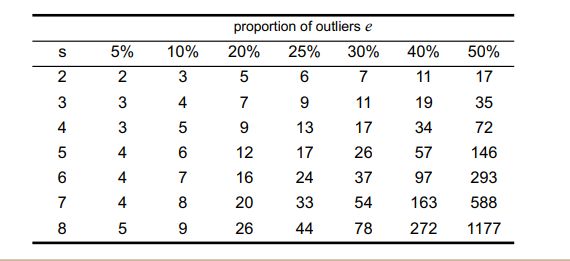

* According to the proportion of outliers table, we should apply around **5 iterations** in order to achieve a high probability (99%) of finding the correct model.

* Due to **random sampling** step in the RANSAC algorithm, we are getting a **different transformation** in each execution of the algorithm

In [ ]:
import numpy as np
import random

def compute_homography_ransac(points_src, points_dst, model="projective", threshold=3.0, max_iterations=1000):
    """
    Computes the homography matrix using RANSAC.

    Parameters:
    - points_src: Source points, a list of (x, y) tuples or a Nx2 numpy array.
    - points_dst: Destination points, a list of (x, y) tuples or a Nx2 numpy array.
    - model: The transformation model ("euclidean", "similarity", "affine", "projective").
    - threshold: Maximum allowed distance between a point and the model for it to be considered an inlier.
    - max_iterations: Maximum number of iterations to run RANSAC.

    Returns:
    - H: The computed homography matrix.
    - inliers: A list of inlier indices.
    """
    assert len(points_src) == len(points_dst), "Number of source and destination points must match."
    assert len(points_src) >= 4, "At least 4 point correspondences are required for a projective model."

    points_src = np.asarray(points_src, dtype=np.float64)
    points_dst = np.asarray(points_dst, dtype=np.float64)

    best_H = None
    best_inliers = []
    max_inliers_count = 0

    for _ in range(max_iterations):
        # Step 1: Randomly sample 4 points (for homography, 4 point pairs are needed)
        sample_indices = random.sample(range(len(points_src)), 4)
        points_src_sample = points_src[sample_indices]
        points_dst_sample = points_dst[sample_indices]

        # Step 2: Compute homography using the selected points (using your existing function)
        H = compute_homography(points_src_sample, points_dst_sample, model)

        # Step 3: Calculate the model error for all points
        inliers = []
        for i in range(len(points_src)):
            point_src = points_src[i]
            point_dst = points_dst[i]

            # Apply the homography to the source point
            point_src_homogeneous = np.array([point_src[0], point_src[1], 1])
            transformed_point = np.dot(H, point_src_homogeneous)
            transformed_point = transformed_point / transformed_point[2]  # Normalize

            # Calculate the distance between the transformed point and the actual destination point
            distance = np.linalg.norm(transformed_point[:2] - point_dst)
            #print(f"distance {distance}")

            # If the distance is smaller than the threshold, consider it an inlier
            if distance < threshold:
                inliers.append(i)

        # Step 4: If we have more inliers, store the current homography matrix
        if len(inliers) > max_inliers_count:
            max_inliers_count = len(inliers)
            best_H = H
            best_inliers = inliers

    # Return the best homography and the inliers
    return best_H, best_inliers


In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def plot_inliers(src_image, dst_image, points_src, points_dst, inlier_indices):
    """
    Plots the inliers on the source and destination images.

    Parameters:
    - src_image: The source image (as a numpy array).
    - dst_image: The destination image (as a numpy array).
    - points_src: Source points as an Nx2 array.
    - points_dst: Destination points as an Nx2 array.
    - inlier_indices: Indices of inliers returned by the RANSAC function.
    """
    # Extract inlier points
    inlier_points_src = points_src[inlier_indices]
    inlier_points_dst = points_dst[inlier_indices]

    # Create a combined image for visualization
    height = max(src_image.shape[0], dst_image.shape[0])
    combined_width = src_image.shape[1] + dst_image.shape[1]
    combined_image = np.zeros((height, combined_width, 3), dtype=np.uint8)

    combined_image[:src_image.shape[0], :src_image.shape[1]] = src_image
    combined_image[:dst_image.shape[0], src_image.shape[1]:] = dst_image

    # Plot inliers with lines
    plt.figure(figsize=(12, 6))
    plt.imshow(combined_image[:, :, ::-1])  # Convert BGR to RGB for Matplotlib
    for src, dst in zip(inlier_points_src, inlier_points_dst):
        src_point = (int(src[0]), int(src[1]))
        dst_point = (int(dst[0]) + src_image.shape[1], int(dst[1]))

        # Draw a line connecting the matched points
        plt.plot([src_point[0], dst_point[0]], [src_point[1], dst_point[1]], color='lime', lw=1)
        # Draw points
        plt.scatter(src_point[0], src_point[1], c='red', s=10, label='Inlier Source')
        plt.scatter(dst_point[0], dst_point[1], c='blue', s=10, label='Inlier Destination')

    plt.title('Inliers Visualization')
    plt.axis('off')
    plt.show()

# Euclidean

In [ ]:
threshold = 300.0
H, inliers = compute_homography_ransac(points1, points2, model="euclidean", threshold=threshold, max_iterations=7)

height, width, channels = image2.shape
warped_image = cv2.warpPerspective(image1, H, (width, height))

inliers_point1 = np.array(points1)[inliers]
inliers_point2 = np.array(points2)[inliers]


inliers_point1_homogeneous = np.hstack([inliers_point1, np.ones((inliers_point1.shape[0], 1))])  # Convert to homogeneous coordinates
warped_inliers_point1 = (H @ inliers_point1_homogeneous.T).T  # Apply the homography
warped_inliers_point1 /= warped_inliers_point1[:, 2][:, np.newaxis]

plt.figure()
plt.imshow(cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB))
plt.scatter(warped_inliers_point1[:, 0], warped_inliers_point1[:, 1], color='g', label='Inliers')
plt.title("Image transformed euclidean")


plot_inliers(image1, image2, points1, points2, inliers)

EuclideanManual= warped_image

**Open CV Function to compare**

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def enforce_euclidean_transform(affine_matrix):
    # Extract the linear transformation part (2x2) from the affine matrix
    A = affine_matrix[:, :2]
    # Perform Singular Value Decomposition (SVD) to isolate rotation
    U, _, Vt = np.linalg.svd(A, full_matrices=True)
    # Reconstruct the matrix with only rotation (no scaling)
    R = U @ Vt  # Proper rotation matrix
    # Construct the Euclidean transformation matrix
    euclidean_matrix = np.eye(2, 3)
    euclidean_matrix[:, :2] = R  # Apply pure rotation
    euclidean_matrix[:, 2] = affine_matrix[:, 2]  # Preserve translation

    return euclidean_matrix

# Compute affine transformation using RANSAC
threshold = 300.0  # Threshold for reprojection error
affine_matrix, inliers_opencv = cv2.estimateAffinePartial2D(
    np.array(points1),
    np.array(points2),
    method=cv2.RANSAC,
    ransacReprojThreshold=threshold,
    maxIters=7
)

# Enforce Euclidean transformation constraints
euclidean_matrix = enforce_euclidean_transform(affine_matrix)

# Convert the inliers mask to a boolean array and filter the inlier points
inliers_opencv = inliers_opencv.ravel() == 1  # Flatten and convert to boolean
inliers_point1 = np.array(points1)[inliers_opencv]
inliers_point2 = np.array(points2)[inliers_opencv]

# Warp the source image using the computed Euclidean transformation
height, width, channels = image2.shape
warped_image = cv2.warpAffine(image1, euclidean_matrix, (width, height))

# Convert inlier points to homogeneous coordinates
inliers_point1_homogeneous = np.hstack(
    [inliers_point1, np.ones((inliers_point1.shape[0], 1))]
)  # Add ones for homogeneous coordinates

# Transform inlier points
warped_inliers_point1 = (euclidean_matrix @ inliers_point1_homogeneous.T).T  # Apply Euclidean transformation

# Plot the warped image and inliers
plt.figure()
plt.imshow(cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB))
plt.scatter(warped_inliers_point1[:, 0], warped_inliers_point1[:, 1], color='g', label='Inliers')
plt.title("Image Transformed Euclidean (OpenCV Execution)")

plot_inliers(image1, image2, points1, points2, inliers_opencv)

EuclideanCV =warped_image


In [ ]:
# Plot the images with grids
fig, axes = plt.subplots(1, 3, figsize=(18, 6))  # 1 row, 3 columns
images = [image1, EuclideanCV, EuclideanManual]
titles = ['Original Image (image1)', 'Euclidean (OpenCV)', 'Euclidean (Implemented Function)']

for ax, img, title in zip(axes, images, titles):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
    ax.set_title(title, fontsize=14)
    ax.grid(color='white', linestyle='--', linewidth=0.5)  # Enable grid
    ax.tick_params(axis='both', which='both', bottom=False, left=False, labelbottom=False, labelleft=False)

plt.tight_layout()
plt.show()

$\color{red}{\text{When comparing qualitative results from OpenCV against the manual implemented function for Euclidean it was found that OpenCV implementation perform higher transformations in translation resulting in a higher discrepancy from the fixed image. }}$

$\color{red}{\text{Result from manual implemention seems to be performing better than the OpenCV functions for this case. One hypothesis for this could be that the threshold for the OpenCV function requires different tuning, as well as adjusting the number of iterations.}}$

#Similarity

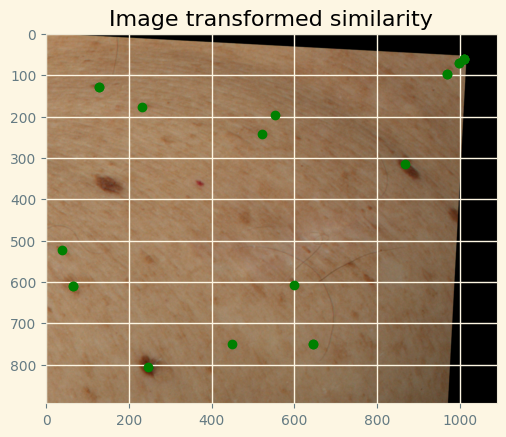

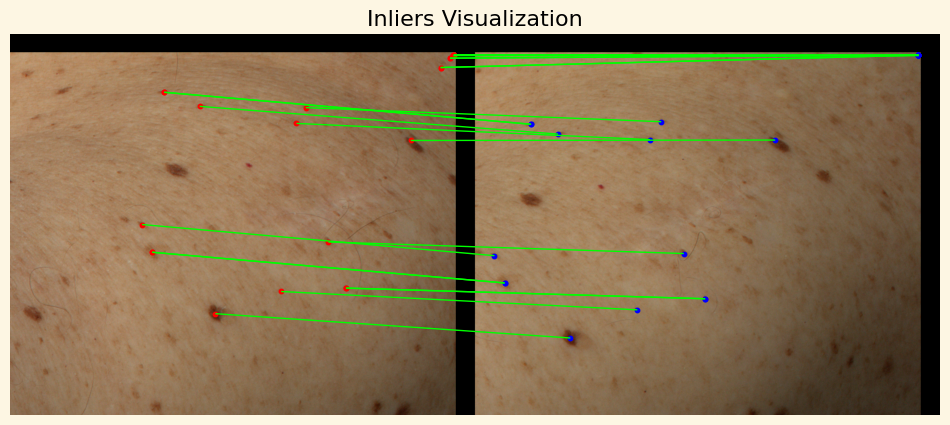

In [ ]:
threshold = 200.0
H, inliers = compute_homography_ransac(points1, points2, model="similarity", threshold=threshold, max_iterations=7)

height, width, channels = image2.shape
warped_image = cv2.warpPerspective(image1, H, (width, height))

inliers_point1 = np.array(points1)[inliers]
inliers_point2 = np.array(points2)[inliers]


inliers_point1_homogeneous = np.hstack([inliers_point1, np.ones((inliers_point1.shape[0], 1))])  # Convert to homogeneous coordinates
warped_inliers_point1 = (H @ inliers_point1_homogeneous.T).T  # Apply the homography
warped_inliers_point1 /= warped_inliers_point1[:, 2][:, np.newaxis]

plt.figure()
plt.imshow(cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB))
plt.scatter(warped_inliers_point1[:, 0], warped_inliers_point1[:, 1], color='g', label='Inliers')
plt.title("Image transformed similarity")


plot_inliers(image1, image2, points1, points2, inliers)
SimilarityManual =warped_image

**Open CV Function to compare**

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def enforce_similarity_transform(affine_matrix):
    #Enforces similarity constraints (uniform scaling and rotation) on an affine transformation matrix.
    # Extract the linear transformation part (2x2) from the affine matrix
    A = affine_matrix[:, :2]
    # Perform Singular Value Decomposition (SVD) to isolate rotation and scaling
    U, _, Vt = np.linalg.svd(A, full_matrices=True)
    # Enforce uniform scaling (average of scaling factors)
    scale = np.mean(np.linalg.norm(A, axis=0))
    # Reconstruct the matrix with uniform scaling and rotation
    R = U @ Vt  # Proper rotation matrix
    similarity_matrix = np.eye(2, 3)
    similarity_matrix[:, :2] = R * scale  # Apply uniform scaling to rotation
    # Preserve the translation from the original affine matrix
    similarity_matrix[:, 2] = affine_matrix[:, 2]
    return similarity_matrix

# Compute affine transformation using RANSAC
threshold = 200.0  # Threshold for reprojection error
affine_matrix, inliers_opencv = cv2.estimateAffinePartial2D(
    np.array(points1),
    np.array(points2),
    method=cv2.RANSAC,
    ransacReprojThreshold=threshold,
    maxIters=7
)

# Enforce similarity transformation constraints
similarity_matrix = enforce_similarity_transform(affine_matrix)

# Convert the inliers mask to a boolean array and filter the inlier points
inliers_opencv = inliers_opencv.ravel() == 1  # Flatten and convert to boolean
inliers_point1 = np.array(points1)[inliers_opencv]
inliers_point2 = np.array(points2)[inliers_opencv]

# Warp the source image using the computed similarity transformation
height, width, channels = image2.shape
warped_image = cv2.warpAffine(image1, similarity_matrix, (width, height))

# Convert inlier points to homogeneous coordinates
inliers_point1_homogeneous = np.hstack(
    [inliers_point1, np.ones((inliers_point1.shape[0], 1))]
)  # Add ones for homogeneous coordinates

# Transform inlier points
warped_inliers_point1 = (similarity_matrix @ inliers_point1_homogeneous.T).T  # Apply similarity transformation

# Plot the warped image and inliers
plt.figure()
plt.imshow(cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB))
plt.scatter(warped_inliers_point1[:, 0], warped_inliers_point1[:, 1], color='g', label='Inliers')
plt.title("Image Transformed Similarity (OpenCV Execution)")

plot_inliers(image1, image2, points1, points2, inliers_opencv)
SimilarityCV =warped_image

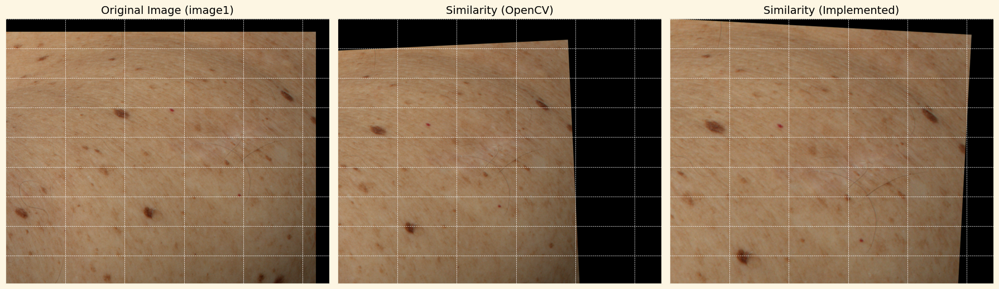

In [ ]:
# Plot the images with grids
fig, axes = plt.subplots(1, 3, figsize=(18, 6))  # 1 row, 3 columns
images = [image1, SimilarityCV, SimilarityManual]
titles = ['Original Image (image1)', 'Similarity (OpenCV)', 'Similarity (Implemented)']

for ax, img, title in zip(axes, images, titles):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct display
    ax.set_title(title, fontsize=14)
    ax.grid(color='white', linestyle='--', linewidth=0.5)  # Add grid lines
    ax.tick_params(axis='both', which='both', bottom=False, left=False, labelbottom=False, labelleft=False)

plt.tight_layout()
plt.show()

$\color{red}{\text{When comparing results from OpenCV against the manual implemented function for Similarity it was found that manual implementation perform a higher scaling transformation which seem unnecessary, although the positioning for the OpenCV transformation was not the best either. }}$

$\color{red}{\text{Both qualitative results are not the best results for the registration of the images but this was expected as deformations may need more changes than the ones covered by the Similarity. }}$

# Affine

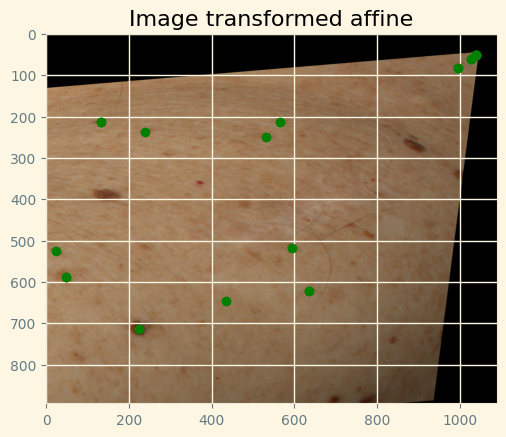

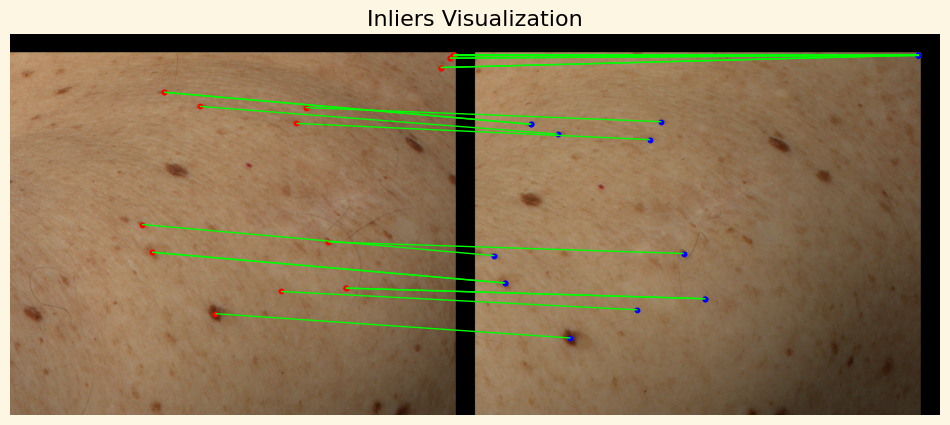

In [ ]:
threshold = 150.0
H, inliers = compute_homography_ransac(points1, points2, model="affine", threshold=threshold, max_iterations=7)

height, width, channels = image2.shape
warped_image = cv2.warpPerspective(image1, H, (width, height))

inliers_point1 = np.array(points1)[inliers]
inliers_point2 = np.array(points2)[inliers]


inliers_point1_homogeneous = np.hstack([inliers_point1, np.ones((inliers_point1.shape[0], 1))])  # Convert to homogeneous coordinates
warped_inliers_point1 = (H @ inliers_point1_homogeneous.T).T  # Apply the homography
warped_inliers_point1 /= warped_inliers_point1[:, 2][:, np.newaxis]

plt.figure()
plt.imshow(cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB))
plt.scatter(warped_inliers_point1[:, 0], warped_inliers_point1[:, 1], color='g', label='Inliers')
plt.title("Image transformed affine")

plot_inliers(image1, image2, points1, points2, inliers)
AffineManual= warped_image

**Open CV Function to compare**

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Compute affine transformation using OpenCV's RANSAC
threshold = 150.0  # Threshold for reprojection error
affine_matrix, inliers_opencv = cv2.estimateAffinePartial2D(
    np.array(points1),
    np.array(points2),
    method=cv2.RANSAC,
    ransacReprojThreshold=threshold,
    maxIters=7
)

# Convert the inliers mask to a boolean array and filter the inlier points
inliers_opencv = inliers_opencv.ravel() == 1  # Flatten and convert to boolean
inliers_point1 = np.array(points1)[inliers_opencv]
inliers_point2 = np.array(points2)[inliers_opencv]

# Warp the source image using the computed affine transformation
height, width, channels = image2.shape
warped_image = cv2.warpAffine(image1, affine_matrix, (width, height))

# Convert inlier points to homogeneous coordinates
inliers_point1_homogeneous = np.hstack(
    [inliers_point1, np.ones((inliers_point1.shape[0], 1))]
)  # Add ones for homogeneous coordinates

# Transform inlier points
warped_inliers_point1 = (affine_matrix @ inliers_point1_homogeneous.T).T  # Apply affine transformation

# Plot the warped image and inliers
plt.figure()
plt.imshow(cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB))
plt.scatter(warped_inliers_point1[:, 0], warped_inliers_point1[:, 1], color='g', label='Inliers')
plt.title("Image Transformed Affine (OpenCV estimateAffinePartial2D function)")

# Plot inliers using the combined visualization function
plot_inliers(image1, image2, points1, points2, inliers_opencv)

AffineCV= warped_image

In [ ]:
# Plot the images with grids
fig, axes = plt.subplots(1, 3, figsize=(18, 6))  # 1 row, 3 columns
images = [image1, AffineCV, AffineManual]
titles = ['Original Image (image1)', 'Affine (OpenCV)', 'Affine (Manual Implementation)']

for ax, img, title in zip(axes, images, titles):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct display
    ax.set_title(title, fontsize=14)
    ax.grid(color='white', linestyle='--', linewidth=0.5)  # Add grid lines
    ax.tick_params(axis='both', which='both', bottom=False, left=False, labelbottom=False, labelleft=False)

plt.tight_layout()
plt.show()

$\color{red}{\text{When comparing qualitative results from OpenCV against the manual implemented function for Affine it was found that manual implementation perform higher transformations resulting in a more similar result to the original image. }}$

$\color{red}{\text{For this occasion the result from the manual implemented was found to be better than the OpenCV one. Conditions used for both functions were tried to be the same in terms of threshold, iterations and the type of model transformation used.}}$

# Projective
Since projective had a 4% of outliers, according to the table, around 4 iteration is enough.

In [ ]:
threshold = 550.0
H, inliers = compute_homography_ransac(points1, points2, model="projective", threshold=threshold, max_iterations=4)

height, width, channels = image2.shape
warped_image = cv2.warpPerspective(image1, H, (width, height))

inliers_point1 = np.array(points1)[inliers]
inliers_point2 = np.array(points2)[inliers]


inliers_point1_homogeneous = np.hstack([inliers_point1, np.ones((inliers_point1.shape[0], 1))])  # Convert to homogeneous coordinates
warped_inliers_point1 = (H @ inliers_point1_homogeneous.T).T  # Apply the homography
warped_inliers_point1 /= warped_inliers_point1[:, 2][:, np.newaxis]

plt.figure()
plt.imshow(cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB))
plt.scatter(warped_inliers_point1[:, 0], warped_inliers_point1[:, 1], color='g', label='Inliers')
plt.title("Image transformed projective")


plot_inliers(image1, image2, points1, points2, inliers)
ProjectiveManual= warped_image

**Open CV Function to compare**

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Compute homography using OpenCV's RANSAC
threshold = 550.0  # Use the same threshold as the manual implementation of the functions
H_opencv, inliers_opencv = cv2.findHomography(
    np.array(points1), np.array(points2), method=cv2.RANSAC, ransacReprojThreshold=threshold, maxIters=4 #Projective is by default
)

# Convert the inliers mask to a boolean array and filter the inlier points
inliers_opencv = inliers_opencv.ravel() == 1  # Flatten and convert to boolean
inliers_point1 = np.array(points1)[inliers_opencv]
inliers_point2 = np.array(points2)[inliers_opencv]

# Warp the source image using the computed homography
height, width, channels = image2.shape
warped_image = cv2.warpPerspective(image1, H_opencv, (width, height))

# Convert inlier points to homogeneous coordinates
inliers_point1_homogeneous = np.hstack(
    [inliers_point1, np.ones((inliers_point1.shape[0], 1))]
)  # Add ones for homogeneous coordinates

# Transform inlier points
warped_inliers_point1 = (H_opencv @ inliers_point1_homogeneous.T).T  # Apply homography
warped_inliers_point1 /= warped_inliers_point1[:, 2][:, np.newaxis]  # Normalize

# Plot the warped image and inliers
plt.figure()
plt.imshow(cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB))
plt.scatter(warped_inliers_point1[:, 0], warped_inliers_point1[:, 1], color='g', label='Inliers')
plt.title("Image Transformed Projective (OpenCV findHomography Execution)")

# Plot inliers using the combined visualization function
plot_inliers(image1, image2, points1, points2, inliers_opencv)
ProjectiveCV= warped_image

In [ ]:
# Plot the images with grids
fig, axes = plt.subplots(1, 3, figsize=(18, 6))  # 1 row, 3 columns
images = [image1, ProjectiveCV, ProjectiveManual]
titles = ['Original Image (image1)', 'Projective (OpenCV)', 'Projective (Manual)']

for ax, img, title in zip(axes, images, titles):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct display
    ax.set_title(title, fontsize=14)
    ax.grid(color='white', linestyle='--', linewidth=0.5)  # Add grid lines
    ax.tick_params(axis='both', which='both', bottom=False, left=False, labelbottom=False, labelleft=False)

plt.tight_layout()
plt.show()

$\color{red}{\text{When comparing qualitative results from OpenCV against the manual implemented function for Projective it was found that manual implementation perform less drastical transformation resulting in a more similar result to the original image. }}$

$\color{red}{\text{For this ocasion the result from the manual implemented was found to be better than the OpenCV one. Conditions used for both functions were tried to be the same in terms of threshold, iterations and the type of model transformation used.}}$


## Extra Work

There are many ways to apply *Deep Learning* for registering images. Do some research and find a solution that uses it and apply it to skin1 and skin2 images.

---
### **LoFTR: Detector-Free Local Feature Matching with Transformers**
https://arxiv.org/abs/2104.00680


*LoFTR (Local Feature TRansformer)* is a deep learning model designed for detector-free local feature matching between images. Unlike traditional methods that rely on explicit keypoint detection and description (e.g., SIFT, ORB),LoFTR leverages transformer architectures to compute dense pixel-wise correspondences directly from image pairs. It employs self- and cross-attention mechanisms to capture both local details and global context, enabling it to establish robust matches even in challenging scenarios with significant viewpoint changes, illumination variations, or low-texture regions. By providing reliable and accurate correspondences, LoFTR enhances tasks like image registration, where precise alignment is critical, by improving the estimation of geometric transformations such as homographies.

**GitHub: https://github.com/zju3dv/LoFTR**

**Kornia documentation: https://kornia.readthedocs.io/en/stable/applications/image_matching.html**

---
**Limitations of Classical Approaches**

Traditional feature matching methods, such as SIFT or ORB, often struggle with significant changes in viewpoints, lighting conditions, or in images containing repetitive or textureless patterns. These methods rely on handcrafted feature detectors and descriptors, which may not capture the complex variations present in real-world scenarios.

**Advantages of Using Deep Learning**

Deep learning approaches offer robustness to variations in appearance and can capture more complex patterns within images. By learning feature representations directly from data, deep learning models adapt better to challenging conditions, providing more reliable and accurate feature matching.

---

**LoFTR: Local Feature Transformer
Overview**

*LoFTR (Local Feature TRansformer)* is a deep learning model designed for dense feature matching without relying on traditional keypoint detection. It eliminates the need for separate keypoint detectors and descriptors by directly **predicting matches** using a transformer-based architecture.

**Key Features**

* *Transformer Architecture*: Utilizes self- and cross-attention mechanisms to capture global context and relationships between all pixel pairs in the images.
* *Dense Matching*: Capable of producing dense, pixel-wise correspondences, even in low-texture or repetitive regions where traditional methods fail.
* *Robustness*: Handles significant variations in viewpoint, illumination, and appearance.

---
**How LoFTR Works**

**1. High-Resolution Feature Extraction**

* The model extracts *high-resolution feature maps* from both input images using Convolutional Neural Network **(CNN)** backbones.
* These feature maps retain detailed *spatial* information crucial for precise matching.

**2. Coarse Matching with Cross-Attention**

* Feature maps are downsampled to reduce computational complexity.
* *Cross-attention* modules are applied to find *coarse correspondences* between the images.
* The cross-attention mechanism allows the model to consider global relationships across all pixel pairs.

**3. Fine Matching at Pixel Level**

* Coarse matches are refined at the pixel level.
* This refinement process produces dense, pixel-wise matches between the images.
* The result is a set of high-confidence correspondences suitable for geometric transformations.


**Model Output**

The model outputs a set of matching keypoints between the two images accompanied by a confidence score.

In [ ]:
!pip install kornia

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 899.4/899.4 kB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 47.3 MB/s eta 0:00:00


In [ ]:
import cv2
import numpy as np
import torch
import kornia as K
import matplotlib.pyplot as plt

In [ ]:
image1 = cv2.imread('/content/drive/MyDrive/MIRAMISA/Lab3MIRA/skin2.png')
image2 = cv2.imread('/content/drive/MyDrive/MIRAMISA/Lab3MIRA/skin1.png')

# Step 4: Load and preprocess images
# Convert images to RGB
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Convert images to grayscale
gray1 = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
gray2 = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

# Normalize and convert to tensors
# Use channels_first=True (default) to get tensor shape [C, H, W]
img1_t = K.image_to_tensor(gray1).float() / 255.0  # Shape: [1, H, W]
img2_t = K.image_to_tensor(gray2).float() / 255.0  # Shape: [1, H, W]

# Add batch dimension
img1_t = img1_t.unsqueeze(0)  # Shape: [1, 1, H, W]
img2_t = img2_t.unsqueeze(0)  # Shape: [1, 1, H, W]

# Print shapes to verify
print('img1_t shape:', img1_t.shape)
print('img2_t shape:', img2_t.shape)


img1_t shape: torch.Size([1, 1, 894, 1090])
img2_t shape: torch.Size([1, 1, 894, 1090])


In [ ]:
# Step 5: Initialize LoFTR model
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)
matcher = K.feature.LoFTR(pretrained='outdoor').to(device)

cpu


Downloading: "http://cmp.felk.cvut.cz/~mishkdmy/models/loftr_outdoor.ckpt" to /root/.cache/torch/hub/checkpoints/loftr_outdoor.ckpt
100%|██████████| 44.2M/44.2M [00:03<00:00, 14.7MB/s]


In [ ]:
# Step 6: Find correspondences
# Prepare input dictionary
input_dict = {"image0": img1_t.to(device), "image1": img2_t.to(device)}

# Inference with LoFTR
with torch.no_grad():
    correspondences = matcher(input_dict)

# Extract matching keypoints
mkpts0 = correspondences['keypoints0'].cpu().numpy()
mkpts1 = correspondences['keypoints1'].cpu().numpy()
confidence = correspondences['confidence'].cpu().numpy()


In [ ]:
# Step 7: Estimate homography
if len(mkpts0) >= 4:
    H, mask = cv2.findHomography(mkpts0, mkpts1, cv2.RANSAC, 5.0)
else:
    print("Not enough matches to compute homography.")
    H = None

# Extract inlier matches
if H is not None:
    # mask is of shape (N, 1), need to flatten it
    matches_mask = mask.ravel().astype(bool)

    # Extract inlier keypoints
    inlier_mkpts0 = mkpts0[matches_mask]
    inlier_mkpts1 = mkpts1[matches_mask]

    # Print the number of inliers
    print(f"Number of inlier matches used for homography: {len(inlier_mkpts0)}")
else:
    print("Homography could not be estimated.")

Number of inlier matches used for homography: 2828


In [ ]:
def draw_matches(img1, img2, kp1, kp2, color=(0, 255, 0)):
    # Create a new output image that concatenates the two images together
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    out_img = np.zeros((max(h1, h2), w1 + w2, 3), dtype='uint8')
    out_img[:h1, :w1, :] = img1
    out_img[:h2, w1:w1 + w2, :] = img2

    # Draw the keypoints and matches
    for (x1, y1), (x2, y2) in zip(kp1, kp2):
        x2 += w1  # shift keypoints on the right image

        # Draw circles
        cv2.circle(out_img, (int(x1), int(y1)), 5, color, -1)
        cv2.circle(out_img, (int(x2), int(y2)), 5, color, -1)

        # Draw line
        cv2.line(out_img, (int(x1), int(y1)), (int(x2), int(y2)), color, 2)

    return out_img

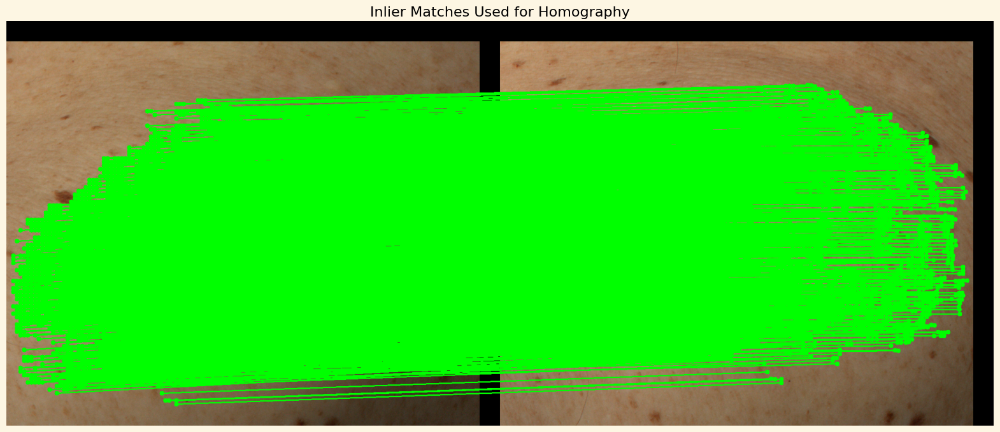

In [ ]:
# Plot inlier matches used for homography
if H is not None and len(inlier_mkpts0) > 0:
    inlier_match_img = draw_matches(image1, image2, inlier_mkpts0, inlier_mkpts1, color=(0, 255, 0))
    plt.figure(figsize=(20, 10))
    plt.imshow(inlier_match_img)
    plt.title('Inlier Matches Used for Homography')
    plt.axis('off')
    plt.show()
else:
    print("No inlier matches to display.")


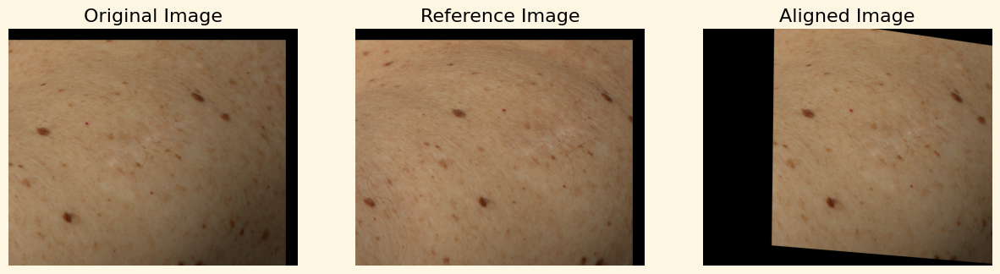

In [ ]:
if H is not None:
    height, width, channels = image2.shape
    aligned_image = cv2.warpPerspective(image1, H, (width, height))

    # Step 9: Visualize the results
    plt.figure(figsize=(15, 10))
    plt.subplot(1, 3, 1)
    plt.imshow(image1)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(image2)
    plt.title('Reference Image')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(aligned_image)
    plt.title('Aligned Image')
    plt.axis('off')
    plt.show()
else:
    print("Homography could not be estimated.")


## Congratulations!
In this lab you:
- tested SIFT Algorithm
- implemented homography computation

Submit this notebook by the lab deadline, with the cells executed and including your **answers** in the text fields in $\color{red}{\text{red}}$ color.